# Project 1: EDA with PySpark

* **Your Group Number:** none
* **Each Team Members Name and Student ID:** PJ Watson 2887247

💚 On Wed morning, I got this error trying to download the PPP files:

Failed to retrieve file url:

	Too many users have viewed or downloaded this file recently. Please
	try accessing the file again later. If the file you are trying to
	access is particularly large or is shared with many people, it may
	take up to 24 hours to be able to view or download the file. If you
	still can't access a file after 24 hours, contact your domain
	administrator.

I downloaded the files, recopied the paths and moved them to directory PPP to be able to continue with existing code.

By submitting this group work, “I accept responsibility for my role in ensuring the integrity of the work submitted by the group in which I participated.”

[source](https://www.rochester.edu/college/honesty/instructors/pledge.html)

# Introduction

The purpose of this project is to help you apply what you learned in the previous lectures to a real-world dataset. At the end of it, you will have a self-contained notebook that you can brag about in job interviews. I've left some code cells and given some info on dataframe shape to help you check your work...

Now let's go tackle the PPP dataset and find some interesting trends using PySpark!

## Download PPP data

You can download the data from here (https://data.sba.gov/dataset/ppp-foia). We will use the first three files.

I have tried copying the link address and pasting it here (so no need to mount your Google Drive) - but the link address changes every few months, so instead we can download locally, drag to Google Drive, and use a shareable link.

In [ ]:
# download the SBA data
# would be great but the link changes every quarter!


#!gdown https://data.sba.gov/dataset/8aa276e2-6cab-4f86-aca4-a7dde42adf24/resource/0187d0dd-1a59-4c99-a04d-982231e68778/download/public_150k_plus_220930.csv
#!gdown https://drive.google.com/uc?id=1JGW0DmOkR39tC8DiExRNbAoAsoy7JGwm.  didn't work
#!gdown https://data.sba.gov/dataset/8aa276e2-6cab-4f86-aca4-a7dde42adf24/resource/ef9a027d-6681-4e36-a1d8-82757dd210b4/download/public_up_to_150k_1_220930.csv
#!gdown https://data.sba.gov/dataset/8aa276e2-6cab-4f86-aca4-a7dde42adf24/resource/cd9ec3d9-515a-4064-b843-2c22ad9046b4/download/public_up_to_150k_2_220930.csv

Failed to retrieve file url:

	Too many users have viewed or downloaded this file recently. Please
	try accessing the file again later. If the file you are trying to
	access is particularly large or is shared with many people, it may
	take up to 24 hours to be able to view or download the file. If you
	still can't access a file after 24 hours, contact your domain
	administrator.

You may still be able to access the file from the browser:

	https://drive.google.com/uc?id=1JGW0DmOkR39tC8DiExRNbAoAsoy7JGwm

but Gdown can't. Please check connections and permissions.


For some reason, I had to upgrade gdown to download a massive .csv file from my Google Drive... run this then try to download the files from your Google Drive!

In [ ]:
!pip install --upgrade --no-cache-dir gdown

In [ ]:
# download from Dave's google drive
!gdown 1JGW0DmOkR39tC8DiExRNbAoAsoy7JGwm
!gdown 1pIgGStXobZM9MkenPTduLfGwcJl9xwZh
!gdown 10C_r3jdN4iOb0KmHg7gk3FIS7DMNriaV
# didn't work 2/13

Failed to retrieve file url:

	Too many users have viewed or downloaded this file recently. Please
	try accessing the file again later. If the file you are trying to
	access is particularly large or is shared with many people, it may
	take up to 24 hours to be able to view or download the file. If you
	still can't access a file after 24 hours, contact your domain
	administrator.

You may still be able to access the file from the browser:

	https://drive.google.com/uc?id=1JGW0DmOkR39tC8DiExRNbAoAsoy7JGwm

but Gdown can't. Please check connections and permissions.
Failed to retrieve file url:

	Too many users have viewed or downloaded this file recently. Please
	try accessing the file again later. If the file you are trying to
	access is particularly large or is shared with many people, it may
	take up to 24 hours to be able to view or download the file. If you
	still can't access a file after 24 hours, contact your domain
	administrator.

You may still be able to access the file from th

If you look left, you should be able to see the three big .csv files on the lefthand side.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Download zipcode-level socioeconomic data
It's generally not known what census tract a business resides in, but the zipcode is almost always known.

(5 census txt files downloaded, GTG)

This repo (https://github.com/Ro-Data/Ro-Census-Summaries-By-Zipcode) has zipcode-level census attributes. I have downloaded all of the files to our local runtime on the left.

In [ ]:
!gdown https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/econ.txt
!gdown https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/demo.txt
!gdown https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/housing.txt
!gdown https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/rural_urban.txt
!gdown https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/social.txt

Downloading...
From: https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/econ.txt
To: /content/econ.txt
49.7MB [00:01, 47.9MB/s]
Downloading...
From: https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/demo.txt
To: /content/demo.txt
26.7MB [00:00, 52.0MB/s]
Downloading...
From: https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/housing.txt
To: /content/housing.txt
49.0MB [00:00, 65.1MB/s]
Downloading...
From: https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/rural_urban.txt
To: /content/rural_urban.txt
923kB [00:00, 17.5MB/s]       
Downloading...
From: https://raw.githubusercontent.com/Ro-Data/Ro-Census-Summaries-By-Zipcode/master/social.txt
To: /content/social.txt
46.0MB [00:00, 61.1MB/s]


# Install Spark

In [ ]:
# install java
!apt-get install openjdk-8-jdk-headless -qq > /dev/null

# install spark (change the version number if needed)
!wget -q https://archive.apache.org/dist/spark/spark-3.0.0/spark-3.0.0-bin-hadoop3.2.tgz

# unzip the spark file to the current folder
!tar xf spark-3.0.0-bin-hadoop3.2.tgz

# set your spark folder to your system path environment.
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.0.0-bin-hadoop3.2"


# install findspark using pip
!pip install -q findspark

# findspark
import findspark
findspark.init()

# Start session

We start the builder pattern `SparkSession.builder` and then chain a configuration parameter that defined the application name.

Providing a useful `appName` helps you identify which programs are running on your Spark cluster.

In [ ]:
from pyspark.sql import SparkSession
# for concise script, we import all functions as F
import pyspark.sql.functions as F

# to correct error changing census data to float
from pyspark.sql.types import *

spark = SparkSession.builder\
        .appName("Project1_EDA_with_PySpark")\
        .getOrCreate()

# 🔴 Organize your folders (5 pts)

## (1) Create a folder on the local runtime called 'census' and copy all of the .txt files over to this folder.  
Like we did in class!

💚 TXT files copied to folder Census, foots to downloads above, GTG

In [ ]:
# make a directory called census
%mkdir ./census

In [ ]:
# move all of the txt files we just downloaded

# %cp [...file/directory-sources] [destination]
%cp /content/demo.txt /content/census
%cp /content/econ.txt /content/census
%cp /content/housing.txt /content/census
%cp /content/rural_urban.txt /content/census
%cp /content/social.txt /content/census

# check work, foots to downloads above, GTG
%ls /content/census

demo.txt  econ.txt  housing.txt  rural_urban.txt  social.txt


## (2) Create a folder on the local runtime called 'PPP' and copy all of the .csv files over to this folder.
Like we did in class! Use mv and not cp.

💚 CSV files moved to folder PPP, foots to downloads above, GTG

In [ ]:
# make a directory called PPP
%mkdir ./PPP

In [ ]:
# move all of the csv files we just downloaded (using mv as instructed)
# paths needed to be changed Wed 2/13  morning

# %mv [...file/directory-sources] [destination]

%mv /content/public_150k_plus_230101.csv /content/PPP
%mv /content/public_up_to_150k_1_230101.csv /content/PPP
%mv /content/public_up_to_150k_2_230101.csv /content/PPP


# check work, foots to downloads above, GTG
%ls /content/PPP

public_150k_plus_230101.csv  public_up_to_150k_1_230101.csv  public_up_to_150k_2_230101.csv


# 🔴 Clean the PPP data (10 points)

Use read to open the files and "ingest" as dataframe. Get the shape and inspect data. Keep a running total of rows and columns.

💚 At first, I read the csv files in as we did in M2.1 Ch2, but upon inspection, realized there was a header, after spending too much time trying to get the first row exploded out of the dataframe somehow. Now reading the csv files with header, comma delimited.

  public_150k_plus     (968,531, 53)

  public_150k_plus_1    (900,000, 53)

  public_150k_plus_2    (900,000, 53)

Total rows, cols expected after concat/append: (2,768,531, 53)

In [ ]:
# inspect the (3) PPP csv files before concat
# use 'read' to open files and ingest as a dataframe

# determined that reading in the csv files w header and delimiter worked
# public_150k_plus = spark.read.text('/content/PPP/public_150k_plus_230101.csv')
# needed to change paths Wed 2/13 morning

public_150k_plus = spark.read.option("delimiter", ",").option("header", True).csv('/content/PPP/public_150k_plus_230101.csv')
public_up_to_150k_1 = spark.read.option("delimiter", ",").option("header", True).csv('/content/PPP/public_up_to_150k_1_230101.csv')
public_up_to_150k_2 = spark.read.option("delimiter", ",").option("header", True).csv('/content/PPP/public_up_to_150k_2_230101.csv')

# confirming dataframes (unnecessary after testing/learning)
print(public_150k_plus)
print(public_up_to_150k_1)
print(public_up_to_150k_2)



DataFrame[LoanNumber: string, DateApproved: string, SBAOfficeCode: string, ProcessingMethod: string, BorrowerName: string, BorrowerAddress: string, BorrowerCity: string, BorrowerState: string, BorrowerZip: string, LoanStatusDate: string, LoanStatus: string, Term: string, SBAGuarantyPercentage: string, InitialApprovalAmount: string, CurrentApprovalAmount: string, UndisbursedAmount: string, FranchiseName: string, ServicingLenderLocationID: string, ServicingLenderName: string, ServicingLenderAddress: string, ServicingLenderCity: string, ServicingLenderState: string, ServicingLenderZip: string, RuralUrbanIndicator: string, HubzoneIndicator: string, LMIIndicator: string, BusinessAgeDescription: string, ProjectCity: string, ProjectCountyName: string, ProjectState: string, ProjectZip: string, CD: string, JobsReported: string, NAICSCode: string, Race: string, Ethnicity: string, UTILITIES_PROCEED: string, PAYROLL_PROCEED: string, MORTGAGE_INTEREST_PROCEED: string, RENT_PROCEED: string, REFINANC

💚 Inspect the PPP data, checking rows and columns.

Printing the schema as well as dtypes is somewhat redundant, but hey, it's a learning exercise.

In [ ]:
# inspect public_150k_plus

public_150k_plus.printSchema()
print(public_150k_plus.dtypes)
print((public_150k_plus.count(), len(public_150k_plus.columns))) #ROWS, COL
public_150k_plus.show(10,False)  # prints x rows, expanded

root
 |-- LoanNumber: string (nullable = true)
 |-- DateApproved: string (nullable = true)
 |-- SBAOfficeCode: string (nullable = true)
 |-- ProcessingMethod: string (nullable = true)
 |-- BorrowerName: string (nullable = true)
 |-- BorrowerAddress: string (nullable = true)
 |-- BorrowerCity: string (nullable = true)
 |-- BorrowerState: string (nullable = true)
 |-- BorrowerZip: string (nullable = true)
 |-- LoanStatusDate: string (nullable = true)
 |-- LoanStatus: string (nullable = true)
 |-- Term: string (nullable = true)
 |-- SBAGuarantyPercentage: string (nullable = true)
 |-- InitialApprovalAmount: string (nullable = true)
 |-- CurrentApprovalAmount: string (nullable = true)
 |-- UndisbursedAmount: string (nullable = true)
 |-- FranchiseName: string (nullable = true)
 |-- ServicingLenderLocationID: string (nullable = true)
 |-- ServicingLenderName: string (nullable = true)
 |-- ServicingLenderAddress: string (nullable = true)
 |-- ServicingLenderCity: string (nullable = true)
 |-

In [ ]:
# inspect public_up_to_150k_1

public_up_to_150k_1.printSchema()
print(public_up_to_150k_1.dtypes)
print((public_up_to_150k_1.count(), len(public_up_to_150k_1.columns))) #ROWS, COL
public_up_to_150k_1.show(10,False)  # prints x rows, expanded

root
 |-- LoanNumber: string (nullable = true)
 |-- DateApproved: string (nullable = true)
 |-- SBAOfficeCode: string (nullable = true)
 |-- ProcessingMethod: string (nullable = true)
 |-- BorrowerName: string (nullable = true)
 |-- BorrowerAddress: string (nullable = true)
 |-- BorrowerCity: string (nullable = true)
 |-- BorrowerState: string (nullable = true)
 |-- BorrowerZip: string (nullable = true)
 |-- LoanStatusDate: string (nullable = true)
 |-- LoanStatus: string (nullable = true)
 |-- Term: string (nullable = true)
 |-- SBAGuarantyPercentage: string (nullable = true)
 |-- InitialApprovalAmount: string (nullable = true)
 |-- CurrentApprovalAmount: string (nullable = true)
 |-- UndisbursedAmount: string (nullable = true)
 |-- FranchiseName: string (nullable = true)
 |-- ServicingLenderLocationID: string (nullable = true)
 |-- ServicingLenderName: string (nullable = true)
 |-- ServicingLenderAddress: string (nullable = true)
 |-- ServicingLenderCity: string (nullable = true)
 |-

In [ ]:
# inspect public_up_to_150k_2

public_up_to_150k_2.printSchema() #
print(public_up_to_150k_2.dtypes)
print((public_up_to_150k_2.count(), len(public_up_to_150k_2.columns))) #ROWS, COL
public_up_to_150k_2.show(10,False)  # prints x rows, expanded

root
 |-- LoanNumber: string (nullable = true)
 |-- DateApproved: string (nullable = true)
 |-- SBAOfficeCode: string (nullable = true)
 |-- ProcessingMethod: string (nullable = true)
 |-- BorrowerName: string (nullable = true)
 |-- BorrowerAddress: string (nullable = true)
 |-- BorrowerCity: string (nullable = true)
 |-- BorrowerState: string (nullable = true)
 |-- BorrowerZip: string (nullable = true)
 |-- LoanStatusDate: string (nullable = true)
 |-- LoanStatus: string (nullable = true)
 |-- Term: string (nullable = true)
 |-- SBAGuarantyPercentage: string (nullable = true)
 |-- InitialApprovalAmount: string (nullable = true)
 |-- CurrentApprovalAmount: string (nullable = true)
 |-- UndisbursedAmount: string (nullable = true)
 |-- FranchiseName: string (nullable = true)
 |-- ServicingLenderLocationID: string (nullable = true)
 |-- ServicingLenderName: string (nullable = true)
 |-- ServicingLenderAddress: string (nullable = true)
 |-- ServicingLenderCity: string (nullable = true)
 |-

## (1) Append/concatenate all of the PPP csv files together
You should end up with ~2.76M rows and 53 columns if you did it right. You only need one line of code if you use the wildcard. Make sure you print the rows and column count to check your work or points off!

💚 There are 2,768,531 rows and 53 columns, foots to rows/cols expected before concat, GTG.


In [ ]:
# append the (3) PPP csv files

ppp_df = public_150k_plus.union(public_up_to_150k_1).union(public_up_to_150k_2)

# check work
ppp_df.printSchema()
print(ppp_df.dtypes)
print((ppp_df.count(), len(ppp_df.columns)))
ppp_df.show(10,False)  # prints x rows, expanded

root
 |-- LoanNumber: string (nullable = true)
 |-- DateApproved: string (nullable = true)
 |-- SBAOfficeCode: string (nullable = true)
 |-- ProcessingMethod: string (nullable = true)
 |-- BorrowerName: string (nullable = true)
 |-- BorrowerAddress: string (nullable = true)
 |-- BorrowerCity: string (nullable = true)
 |-- BorrowerState: string (nullable = true)
 |-- BorrowerZip: string (nullable = true)
 |-- LoanStatusDate: string (nullable = true)
 |-- LoanStatus: string (nullable = true)
 |-- Term: string (nullable = true)
 |-- SBAGuarantyPercentage: string (nullable = true)
 |-- InitialApprovalAmount: string (nullable = true)
 |-- CurrentApprovalAmount: string (nullable = true)
 |-- UndisbursedAmount: string (nullable = true)
 |-- FranchiseName: string (nullable = true)
 |-- ServicingLenderLocationID: string (nullable = true)
 |-- ServicingLenderName: string (nullable = true)
 |-- ServicingLenderAddress: string (nullable = true)
 |-- ServicingLenderCity: string (nullable = true)
 |-

There are zipcode fields for the business and the banks! But be careful, there are null values!

## (2) Clean the zipcode column for PPP files
There are some that are missing and there are some that have a long format (12345-6789).

We only want records where the `BorrowerZip`:
*  zip code exists (is non-null)
*  if it does exist, make return only the first 5 digits (https://www.datasciencemadesimple.com/extract-first-n-and-last-n-character-in-pyspark/)

💚 Now answer:

I examined the head and tail of BorrowerZip to identify nulls and any other strange data. There are nulls as well as text input into the wrong fields in some rows (e.g., state or city data instead of zipcode in BorrowerZip). Executive decision to not recode the rows with miscoded data, but drop them as it's a very small number.

💚 How many rows did you drop?

Dropped 171 rows in total

BorrowerZip nulls = 161 rows

BorrowerZip text data (state, city miscodes) = 10 rows


2,768,531 - 171 = 2,768,360 rows remaining

💚 What percentage of the original data was returned? Do you think this is acceptable data quality?

2,768,360 / 2,768,531 = 99.99% of original data was returned which seems acceptable data quality to me.

In [ ]:
# examine BorrowerZip
# we don't want to print all zips, as there are many, just confirm nulls, so sort ascending
# keep increasing show number of rows to visually inspect nulls and confirm number of expected rows dropped

# this is long-winded, use groupBy as well below

# we now know there are less than 200 BorrowerZip nulls and a small number (10) of
# miscoded text BorrowerZips at the end of the df

ppp_df.orderBy("BorrowerZip", ascending=True).show(200,False)

# examine tail of BorrowerZip as well, look for trash
# will need to select only numeric zips because df has misaligned data entered

ppp_df.orderBy("BorrowerZip", ascending=False).show(100,False)

+----------+------------+-------------+----------------+------------------------------------------------------------+-------------------------------------------------+--------------+-------------+-----------+--------------+------------+----+---------------------+---------------------+---------------------+-----------------+---------------------+-------------------------+-----------------------------------------+----------------------------------+-------------------+--------------------+------------------+-------------------+----------------+------------+---------------------------------+--------------+-----------------+------------+----------+----+------------+---------+--------------------------------+----------------------+-----------------+---------------+-------------------------+------------+----------------------+-------------------+---------------------+-------------------------------+---------------------------+-----------------------------------------+---------------------+---

In [ ]:
# sort ascending to get number of BorrowerZip nulls
# BorrowerZip nulls = 161

ppp_df.groupBy('BorrowerZip').count().orderBy(F.col('BorrowerZip').asc()).show(5)

+-----------+-----+
|BorrowerZip|count|
+-----------+-----+
|       null|  161|
|      00092|    1|
|      00256|    1|
|      00601|    2|
|      00602|   17|
+-----------+-----+
only showing top 5 rows



In [ ]:
# sort descending to get number of BorrowerZip text data
# BorrowerZip text data (state, city miscodes) = 10

ppp_df.groupBy('BorrowerZip').count().orderBy(F.col('BorrowerZip').desc()).show()

+-----------+-----+
|BorrowerZip|count|
+-----------+-----+
|         TX|    2|
|         NC|    1|
|         KY|    1|
|     GROTON|    1|
|         CO|    1|
|         CA|    3|
|         AR|    1|
| 99950-0280|    1|
|      99950|   11|
| 99929-9999|    1|
| 99929-2345|    1|
| 99929-2245|    1|
| 99929-2224|    1|
| 99929-2199|    1|
| 99929-2183|    1|
| 99929-2157|    1|
| 99929-2076|    1|
| 99929-1996|    2|
| 99929-1994|    1|
| 99929-1851|    1|
+-----------+-----+
only showing top 20 rows



In [55]:
# drop rows where BorrowerZip = null or has miscoded text
# should drop 161 + 10 = 171 rows, resulting in (2,768,531 - 171) = 2,768,360 rows
# drop in 2 steps, verifying rows dropped

# drop nulls first

print('Before the nulls drop...')
print(ppp_df.count(), len(ppp_df.columns))

ppp_df_no_nulls = ppp_df.where(ppp_df['BorrowerZip'].isNotNull())

print('After the nulls drop...')
print(ppp_df_no_nulls.count(), len(ppp_df_no_nulls.columns))

# inspect
# sort ascending to get number of BorrowerZip nulls
# BorrowerZip nulls = 0
ppp_df_no_nulls.groupBy('BorrowerZip').count().orderBy(F.col('BorrowerZip').asc()).show(5)

Before the nulls drop...
2768531 53
After the nulls drop...
2768370 53
+-----------+-----+
|BorrowerZip|count|
+-----------+-----+
|      00092|    1|
|      00256|    1|
|      00601|    2|
|      00602|   17|
|      00603|   26|
+-----------+-----+
only showing top 5 rows



In [56]:
# drop BorrowerZip miscoded with text

print('Before the miscoded BorrowerZip drop...')
print(ppp_df_no_nulls.count(), len(ppp_df_no_nulls.columns))

# tried a couple different ways to drop rows where BorrowerZip = text
# ppp_df_cleaned = ppp_df_no_nulls.where(ppp_df_no_nulls['BorrowerZip'].isNumeric())
# ppp_df_cleaned = ppp_df_no_nulls.where(str.isnumeric(F.col('BorrowerZip')))

ppp_df_cleaned = ppp_df_no_nulls.filter(~ppp_df_no_nulls['BorrowerZip'].rlike('^[a-zA-Z]+$'))

print('After the miscoded BorrowerZip drop...')
print(ppp_df_cleaned.count(), len(ppp_df_cleaned.columns))

# inspect
# sort descending to get the number of BorrowerZip miscodes
# BorrowerZip miscodes = 0
ppp_df_cleaned.groupBy('BorrowerZip').count().orderBy(F.col('BorrowerZip').desc()).show(5)

# ppp_df_cleaned = (2,768,360, 53) as expected net of nulls and miscodes


Before the miscoded BorrowerZip drop...
2768370 53
After the miscoded BorrowerZip drop...
2768360 53
+-----------+-----+
|BorrowerZip|count|
+-----------+-----+
| 99950-0280|    1|
|      99950|   11|
| 99929-9999|    1|
| 99929-2345|    1|
| 99929-2245|    1|
+-----------+-----+
only showing top 5 rows



In [57]:
# make BorrowerZip only 5 digits
# ppp_df_5digitZip will be the file joined to the aggregate census file

# refresh BorrowerZip

print('Before BorrowerZip substring...')
ppp_df_cleaned.show(10,False)  # prints x rows, expanded

ppp_df_5digitZip = ppp_df_cleaned.withColumn('BorrowerZip', F.substring('BorrowerZip', 1, 5))

print('After BorrowerZip substring...')
ppp_df_5digitZip.show(10,False)  # prints x rows, expanded

# refresh ppp_df, confirm BorrowerZip is still string
ppp_df_5digitZip.printSchema()
print(ppp_df_5digitZip.dtypes)

Before BorrowerZip substring...
+----------+------------+-------------+----------------+------------------------------------------------+---------------------------------+----------------+-------------+-----------+--------------+------------+----+---------------------+---------------------+---------------------+-----------------+-------------+-------------------------+-----------------------------------------------+-----------------------+-------------------+--------------------+------------------+-------------------+----------------+------------+---------------------------------+----------------+-----------------+------------+----------+-----+------------+---------+--------------------------------+----------------------+-----------------+---------------+-------------------------+------------+----------------------+-------------------+---------------------+-------------------------------+---------------------------+-----------------------------------------------+---------------------+-

# 🔴 Clean up ALL census files (10 points)
Try to use as little code as possible. You should end up with exactly 33120 rows and ~900 columns (depending on if you dropped the dirty zip code column.)


💚 Open the (5) census txt files with read to "ingest" as dataframes, get shape and inspect data. Keep a running total of rows and cols. Note that the text files are tab delimited, per documentation (in How to Read with Pandas section).

💚 All columns except ZCTA5 should be float; ZCTA5 should remain as string.
The data in ZCTA5 varies in number of characters, and needs to be changed to consistent formatting before concatenating the 5 census files, as well as to match ppp_df_5digitZip.

💚 File totals: 33,120 rows, 891 columns

demo_df (33120, 153)

econ_df (33120, 225)

housing_df (33120, 255)

rural_urban_df (33120, 6)

social_df (33120, 252)

## (1) Read the files

💚 Inspect/clean/cast to float individual census files. ? could have changed field type to float after concat, but decided to inspect files individually.

In [58]:
# inspect demo census file (sex, age, race etc)

demo_df = spark.read.option('header', 'true')\
          .option('delimiter', '\t')\
          .option('inferSchema', 'true')\
          .csv('/content/census/demo.txt')
print((demo_df.count(), len(demo_df.columns))) #ROWS, COL
demo_df.printSchema()
demo_df.show(10,False)

# demo_df percentage columns have some data with extended decimal places
# review after casting to float
# ZCTA5 is int, needs to be string
# this ZCTA5 is left justifed

(33120, 153)
root
 |-- ZCTA5: integer (nullable = true)
 |-- sex_and_age-population-total_population: integer (nullable = true)
 |-- sex_and_age-population-male_total_population: integer (nullable = true)
 |-- sex_and_age-percent-male-of-total_population: double (nullable = true)
 |-- sex_and_age-population-female_total_population: integer (nullable = true)
 |-- sex_and_age-percent-female-of-total_population: double (nullable = true)
 |-- sex_and_age-population-under_5_years_total_population: integer (nullable = true)
 |-- sex_and_age-percent-under_5_years-of-total_population: double (nullable = true)
 |-- sex_and_age-population-5_to_9_years_total_population: integer (nullable = true)
 |-- sex_and_age-percent-5_to_9_years-of-total_population: double (nullable = true)
 |-- sex_and_age-population-10_to_14_years_total_population: integer (nullable = true)
 |-- sex_and_age-percent-10_to_14_years-of-total_population: double (nullable = true)
 |-- sex_and_age-population-15_to_19_years_total_

In [59]:
from pyspark.sql.functions import lpad

# desired length of the zip code field
desired_length = 5

# pad with zeros on the left to match the key length
demo_df = demo_df.withColumn("ZCTA5", lpad(demo_df["ZCTA5"], desired_length, "0"))

demo_df.show(5)

+-----+---------------------------------------+--------------------------------------------+--------------------------------------------+----------------------------------------------+----------------------------------------------+-----------------------------------------------------+-----------------------------------------------------+----------------------------------------------------+----------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+-----

In [60]:
# use cast to change all columns except ZCTA5 to float
# ZCTA5 needs to be string for key match with ppp_df_5digitZip

for column in demo_df.columns:
    if column != "ZCTA5":
        demo_df = demo_df.withColumn(column, demo_df[column].cast(FloatType()))

demo_df = demo_df.withColumn("ZCTA5", demo_df["ZCTA5"].cast("string"))

demo_df.printSchema()
demo_df.show()


root
 |-- ZCTA5: string (nullable = true)
 |-- sex_and_age-population-total_population: float (nullable = true)
 |-- sex_and_age-population-male_total_population: float (nullable = true)
 |-- sex_and_age-percent-male-of-total_population: float (nullable = true)
 |-- sex_and_age-population-female_total_population: float (nullable = true)
 |-- sex_and_age-percent-female-of-total_population: float (nullable = true)
 |-- sex_and_age-population-under_5_years_total_population: float (nullable = true)
 |-- sex_and_age-percent-under_5_years-of-total_population: float (nullable = true)
 |-- sex_and_age-population-5_to_9_years_total_population: float (nullable = true)
 |-- sex_and_age-percent-5_to_9_years-of-total_population: float (nullable = true)
 |-- sex_and_age-population-10_to_14_years_total_population: float (nullable = true)
 |-- sex_and_age-percent-10_to_14_years-of-total_population: float (nullable = true)
 |-- sex_and_age-population-15_to_19_years_total_population: float (nullable = t

In [61]:
# inspect econ census file (employment status, industry, health insur, poverty level)

econ_df = spark.read.option('header', 'true')\
          .option('delimiter', '\t')\
          .option('inferSchema', 'true')\
          .csv('/content/census/econ.txt')

print((econ_df.count(), len(econ_df.columns))) #ROWS, COL
econ_df.printSchema()
econ_df.show(10,False)

# econ_df percentage columns have some data with extended decimal places
# review after casting to float
# ZCTA5 is int, needs to be string
# ZCTA5 is right justofoed like demo_df

(33120, 225)
root
 |-- ZCTA5: integer (nullable = true)
 |-- employment_status-population-population_16_years_and_over: integer (nullable = true)
 |-- employment_status-population-in_labor_force_population_16_years_and_over: integer (nullable = true)
 |-- employment_status-percent-in_labor_force-of-population_16_years_and_over: double (nullable = true)
 |-- employment_status-population-in_civilian_labor_force_population_16_years_and_over: integer (nullable = true)
 |-- employment_status-percent-in_civilian_labor_force-of-population_16_years_and_over: double (nullable = true)
 |-- employment_status-population-employed_population_16_years_and_over: integer (nullable = true)
 |-- employment_status-percent-employed-of-population_16_years_and_over: double (nullable = true)
 |-- employment_status-population-unemployed_population_16_years_and_over: integer (nullable = true)
 |-- employment_status-percent-unemployed-of-population_16_years_and_over: double (nullable = true)
 |-- employment_stat

In [62]:
# from pyspark.sql.functions import lpad

# desired length of the zip code field
desired_length = 5

# pad with zeros on the left to match the key length
econ_df = econ_df.withColumn("ZCTA5", lpad(econ_df["ZCTA5"], desired_length, "0"))

econ_df.show(5)

+-----+---------------------------------------------------------+------------------------------------------------------------------------+------------------------------------------------------------------------+---------------------------------------------------------------------------------+---------------------------------------------------------------------------------+------------------------------------------------------------------+------------------------------------------------------------------+--------------------------------------------------------------------+--------------------------------------------------------------------+----------------------------------------------------------------------+----------------------------------------------------------------------+----------------------------------------------------------------------------+----------------------------------------------------------------------------+---------------------------------------------------------

In [63]:
# use cast to change all columns except ZCTA5 to float
# ZCTA5 needs to be string for key match with ppp_df_5digitZip

# now try If Else

for column in econ_df.columns:
  if column == "ZCTA5":
    econ_df = econ_df.withColumn(column, econ_df[column].cast("string"))
  else:
    econ_df = econ_df.withColumn(column, econ_df[column].cast(FloatType()))
econ_df.printSchema()
econ_df.show()

root
 |-- ZCTA5: string (nullable = true)
 |-- employment_status-population-population_16_years_and_over: float (nullable = true)
 |-- employment_status-population-in_labor_force_population_16_years_and_over: float (nullable = true)
 |-- employment_status-percent-in_labor_force-of-population_16_years_and_over: float (nullable = true)
 |-- employment_status-population-in_civilian_labor_force_population_16_years_and_over: float (nullable = true)
 |-- employment_status-percent-in_civilian_labor_force-of-population_16_years_and_over: float (nullable = true)
 |-- employment_status-population-employed_population_16_years_and_over: float (nullable = true)
 |-- employment_status-percent-employed-of-population_16_years_and_over: float (nullable = true)
 |-- employment_status-population-unemployed_population_16_years_and_over: float (nullable = true)
 |-- employment_status-percent-unemployed-of-population_16_years_and_over: float (nullable = true)
 |-- employment_status-population-armed_forces_p

In [64]:
# inspect housing census file (occupancy, units, struc year, BRs, heating, tenure, vehicles, value, mortgage, rent)

housing_df = spark.read.option('header', 'true')\
          .option('delimiter', '\t')\
          .option('inferSchema', 'true')\
          .csv('/content/census/housing.txt')
print((housing_df.count(), len(housing_df.columns))) #ROWS, COL
housing_df.printSchema()
housing_df.show(10,False)

# housing_df percentage columns have some data with extended decimal places
# review after casting to float
# ZCTA5 is int, needs to be string
# ZCTA5 is left justified

(33120, 255)
root
 |-- ZCTA5: integer (nullable = true)
 |-- housing_occupancy-housing_units-total_housing_units: integer (nullable = true)
 |-- housing_occupancy-housing_units-occupied_housing_units_total_housing_units: integer (nullable = true)
 |-- housing_occupancy-percent-occupied_housing_units-of-total_housing_units: double (nullable = true)
 |-- housing_occupancy-housing_units-vacant_housing_units_total_housing_units: integer (nullable = true)
 |-- housing_occupancy-percent-vacant_housing_units-of-total_housing_units: double (nullable = true)
 |-- housing_occupancy-percent-homeowner_vacancy_rate-of-total_housing_units_for_sale: double (nullable = true)
 |-- housing_occupancy-percent-rental_vacancy_rate-of-total_housing_units_for_sale: double (nullable = true)
 |-- units_in_structure-housing_units-total_housing_units: integer (nullable = true)
 |-- units_in_structure-housing_units-1_unit_detached_total_housing_units: integer (nullable = true)
 |-- units_in_structure-percent-1_uni

In [65]:
# from pyspark.sql.functions import lpad

# desired length of the zip code field
desired_length = 5

# pad with zeros on the left to match the key length
housing_df = housing_df.withColumn("ZCTA5", lpad(housing_df["ZCTA5"], desired_length, "0"))

housing_df.show(5)

+-----+---------------------------------------------------+--------------------------------------------------------------------------+-----------------------------------------------------------------------+------------------------------------------------------------------------+---------------------------------------------------------------------+--------------------------------------------------------------------------------+-----------------------------------------------------------------------------+----------------------------------------------------+--------------------------------------------------------------------+-----------------------------------------------------------------+--------------------------------------------------------------------+-----------------------------------------------------------------+------------------------------------------------------------+---------------------------------------------------------+--------------------------------------------------

In [66]:
# housing_df cast to float failed because columns have periods, dash rather than underscore
# rename col (finding these as we go along; if many, will combine)
# ask DD if we need to check col names in pyspark routinely up front

housing_df = housing_df.withColumnRenamed(
    "house_heating_fuel-housing_units-fuel_oil_kerosene_etc._occupied_housing_units",
    "house_heating_fuel_housing_units_fuel_oil_kerosene_etc_occupied_housing_units"
)
housing_df = housing_df.withColumnRenamed(
    "house_heating_fuel-percent-fuel_oil_kerosene_etc.-of-occupied_housing_units",
    "house_heating_fuel_percent_fuel_oil_kerosene_etc_of_occupied_housing_units"
)
#house_heating_fuel_percent-fuel_oil_kerosene_etc.-of-occupied_housing_units
# house_heating_fuel_percent-fuel_oil_kerosene_etc.-of-occupied_housing_units

In [68]:
# use cast to change all columns except ZCTA5 to float
# ZCTA5 needs to be string for key match with ppp_df_5digitZip

for column in housing_df.columns:
  if column == "ZCTA5":
    housing_df = housing_df.withColumn(column, housing_df[column].cast("string"))
  else:
    housing_df = housing_df.withColumn(column, housing_df[column].cast(FloatType()))

housing_df.printSchema()
housing_df.show()

root
 |-- ZCTA5: string (nullable = true)
 |-- housing_occupancy-housing_units-total_housing_units: float (nullable = true)
 |-- housing_occupancy-housing_units-occupied_housing_units_total_housing_units: float (nullable = true)
 |-- housing_occupancy-percent-occupied_housing_units-of-total_housing_units: float (nullable = true)
 |-- housing_occupancy-housing_units-vacant_housing_units_total_housing_units: float (nullable = true)
 |-- housing_occupancy-percent-vacant_housing_units-of-total_housing_units: float (nullable = true)
 |-- housing_occupancy-percent-homeowner_vacancy_rate-of-total_housing_units_for_sale: float (nullable = true)
 |-- housing_occupancy-percent-rental_vacancy_rate-of-total_housing_units_for_sale: float (nullable = true)
 |-- units_in_structure-housing_units-total_housing_units: float (nullable = true)
 |-- units_in_structure-housing_units-1_unit_detached_total_housing_units: float (nullable = true)
 |-- units_in_structure-percent-1_unit_detached-of-total_housing_

In [ ]:
# read rural_urban census file (pop counts, %)

rural_urban_df = spark.read.option('header', 'true')\
          .option('delimiter', '\t')\
          .option('inferSchema', 'true')\
          .csv('/content/census/rural_urban.txt')
print((rural_urban_df.count(), len(rural_urban_df.columns))) #ROWS, COL
rural_urban_df.printSchema()
rural_urban_df.show(10,False)
# ZCTA5 is int, needs to be string
# ZCTA5 is left justified

In [71]:
# from pyspark.sql.functions import lpad    # remove redundant imports later

# desired length of the zip code field
desired_length = 5

# pad with zeros on the left to match the key length
rural_urban_df = rural_urban_df.withColumn("ZCTA5", lpad(rural_urban_df["ZCTA5"], desired_length, "0"))

rural_urban_df.show(5)

+-----+---------------------------------------+---------------------------------------------+---------------------------------------------+--------------------------------------------------------+--------------------------------------------------------+
|ZCTA5|urban_rural-population-total_population|urban_rural-population-urban_total_population|urban_rural-population-rural_total_population|urban_rural-percent-urban_population-of-total_population|urban_rural-percent-rural_population-of-total_population|
+-----+---------------------------------------+---------------------------------------------+---------------------------------------------+--------------------------------------------------------+--------------------------------------------------------+
|00601|                                18570.0|                                      10679.0|                                       7891.0|                                                   0.575|                                          

In [72]:
# use cast to change all columns except ZCTA5 to float (no float function)
# ZCTA5 needs to be string for key match with ppp_df_5digitZip

for column in rural_urban_df.columns:
  if column == "ZCTA5":
    rural_urban_df = rural_urban_df.withColumn(column, rural_urban_df[column].cast("string"))
  else:
    rural_urban_df = rural_urban_df.withColumn(column, rural_urban_df[column].cast(FloatType()))

rural_urban_df.printSchema()
rural_urban_df.show()

root
 |-- ZCTA5: string (nullable = true)
 |-- urban_rural-population-total_population: float (nullable = true)
 |-- urban_rural-population-urban_total_population: float (nullable = true)
 |-- urban_rural-population-rural_total_population: float (nullable = true)
 |-- urban_rural-percent-urban_population-of-total_population: float (nullable = true)
 |-- urban_rural-percent-rural_population-of-total_population: float (nullable = true)

+-----+---------------------------------------+---------------------------------------------+---------------------------------------------+--------------------------------------------------------+--------------------------------------------------------+
|ZCTA5|urban_rural-population-total_population|urban_rural-population-urban_total_population|urban_rural-population-rural_total_population|urban_rural-percent-urban_population-of-total_population|urban_rural-percent-rural_population-of-total_population|
+-----+---------------------------------------+------

In [73]:
# inspect social census file (hh type, marital, fertility, gparents, school, edu, vet, disability, ancestry)

social_df = spark.read.option('header', 'true')\
          .option('delimiter', '\t')\
          .option('inferSchema', 'true')\
          .csv('/content/census/social.txt')
print((social_df.count(), len(social_df.columns))) #ROWS, COL
social_df.printSchema()
social_df.show(10,False)
# ZCTA5 is int, needs to be string
# ZCTA5 is left justified (4 not 3 digits)

(33120, 252)
root
 |-- ZCTA5: integer (nullable = true)
 |-- households_by_type-total_households: integer (nullable = true)
 |-- households_by_type-households-family_households: integer (nullable = true)
 |-- households_by_type-percent-family_households-of-total_households: double (nullable = true)
 |-- households_by_type-households-family_households_with_own_children_of_the_householder_under_18_years: integer (nullable = true)
 |-- households_by_type-percent-family_households_with_own_children_of_the_householder_under_18_years-of-total_households: double (nullable = true)
 |-- households_by_type-households-married_couple_family_households: integer (nullable = true)
 |-- households_by_type-percent-married_couple_familiy_households-of-total_households: double (nullable = true)
 |-- households_by_type-households-married_couple_family_households_with_own_children_of_the_householder_under_18_years: integer (nullable = true)
 |-- households_by_type-percent-married_couple_family_households_w

In [74]:
# from pyspark.sql.functions import lpad    # remove redundant imports later

# desired length of the zip code field
desired_length = 5

# pad with zeros on the left to match the key length
social_df = social_df.withColumn("ZCTA5", lpad(social_df["ZCTA5"], desired_length, "0"))

social_df.show(5)

+-----+-----------------------------------+-----------------------------------------------+----------------------------------------------------------------+---------------------------------------------------------------------------------------------------+--------------------------------------------------------------------------------------------------------------------+--------------------------------------------------------------+--------------------------------------------------------------------------------+------------------------------------------------------------------------------------------------------------------+-----------------------------------------------------------------------------------------------------------------------------------+--------------------------------------------------------------------------------+-------------------------------------------------------------------------------------------------+---------------------------------------------------------

In [75]:
# use cast to change all columns except ZCTA5 to float (no float function)
# ZCTA5 needs to be string for key match with ppp_df_5digitZip

for column in social_df.columns:
  if column == "ZCTA5":
    social_df = social_df.withColumn(column, social_df[column].cast("string"))
  else:
    social_df = social_df.withColumn(column, social_df[column].cast(FloatType()))

social_df.printSchema()
social_df.show()

root
 |-- ZCTA5: string (nullable = true)
 |-- households_by_type-total_households: float (nullable = true)
 |-- households_by_type-households-family_households: float (nullable = true)
 |-- households_by_type-percent-family_households-of-total_households: float (nullable = true)
 |-- households_by_type-households-family_households_with_own_children_of_the_householder_under_18_years: float (nullable = true)
 |-- households_by_type-percent-family_households_with_own_children_of_the_householder_under_18_years-of-total_households: float (nullable = true)
 |-- households_by_type-households-married_couple_family_households: float (nullable = true)
 |-- households_by_type-percent-married_couple_familiy_households-of-total_households: float (nullable = true)
 |-- households_by_type-households-married_couple_family_households_with_own_children_of_the_householder_under_18_years: float (nullable = true)
 |-- households_by_type-percent-married_couple_family_households_with_own_children_of_the_hou

## (2) Join files together

Hint: everything except the zipcode column should be converted to float... check the schema to be sure...
* https://sparkbyexamples.com/pyspark/pyspark-join-two-or-multiple-dataframes/

💚 Start by joining census files one by one; play with dropping redundant key column.

💚 Refresh files:

💚 File totals: 33,120 rows, 891 columns

demo_df (33,120, 153)

econ_df (33,120, 225) (after join 378-1 = 377 cols)

housing_df (33,120, 255) (after join 632-1 = 631 cols)

rural_urban_df (33,120, 6) (after join 637-1 = 636 cols)

social_df (33,120, 252) (after join 888-1 = 887 cols)

In [76]:
# Using Join expression
# format from link: empDF.join(addDF,empDF["emp_id"] == addDF["emp_id"]).show()
# this should result in duplicate ZCTA5 columns (CONFIRMED)

# check key field ZCTA5 before join
print('This is demo_df:')
demo_df.show(10)
print('This is econ_df:')
econ_df.show(10)

census_df = demo_df.join(econ_df, demo_df["ZCTA5"] == econ_df["ZCTA5"])

print((census_df.count(), len(census_df.columns))) #ROWS, COL
# census_df.printSchema()
census_df.show(10,False)

# (33120, 378) with duplicate ZCTA5 fields

This is demo_df:
+-----+---------------------------------------+--------------------------------------------+--------------------------------------------+----------------------------------------------+----------------------------------------------+-----------------------------------------------------+-----------------------------------------------------+----------------------------------------------------+----------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+-------------------------------------------

In [77]:
# In order to remove this duplicate column,
# specify the join column as an array type or string

# example format from link
# removes duplicate columns
# empDF.join(addDF,["emp_id"]).show()

# joining demo_df and econ_df -> census_df
census_df = demo_df.join(econ_df,["ZCTA5"])

print((census_df.count(), len(census_df.columns))) #ROWS, COL
# census_df.printSchema()
census_df.show(10,False)

# (33120, 377) withOUT duplicate ZCTA5 fields

(33120, 377)
+-----+---------------------------------------+--------------------------------------------+--------------------------------------------+----------------------------------------------+----------------------------------------------+-----------------------------------------------------+-----------------------------------------------------+----------------------------------------------------+----------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+-----------------------------------------------

In [78]:
# joining housing_df -> census_df (overwriting census_df iteratively)

# example format from link
# removes duplicate columns
# empDF.join(addDF,["emp_id"]).show()

census_df = census_df.join(housing_df,["ZCTA5"])

print((census_df.count(), len(census_df.columns))) #ROWS, COL
# census_df.printSchema()
census_df.show(10,False)

# (33120, 631) withOUT duplicate ZCTA5 fields

(33120, 631)
+-----+---------------------------------------+--------------------------------------------+--------------------------------------------+----------------------------------------------+----------------------------------------------+-----------------------------------------------------+-----------------------------------------------------+----------------------------------------------------+----------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+-----------------------------------------------

In [79]:
# joining rural_urban_df -> census_df (overwriting census_df iteratively)

# example format from link
# removes duplicate columns
# empDF.join(addDF,["emp_id"]).show()

census_df = census_df.join(rural_urban_df,["ZCTA5"])

print((census_df.count(), len(census_df.columns))) #ROWS, COL
# census_df.printSchema()
census_df.show(10,False)

# (33120, 636) withOUT duplicate ZCTA5 fields

(33120, 636)
+-----+---------------------------------------+--------------------------------------------+--------------------------------------------+----------------------------------------------+----------------------------------------------+-----------------------------------------------------+-----------------------------------------------------+----------------------------------------------------+----------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+-----------------------------------------------

In [80]:
# joining social_df -> census_df (overwriting census_df iteratively)

# example format from link
# removes duplicate columns
# empDF.join(addDF,["emp_id"]).show()

census_df = census_df.join(social_df,["ZCTA5"])

print((census_df.count(), len(census_df.columns))) #ROWS, COL
# census_df.printSchema()
census_df.show(10,False)

# (33120, 887) withOUT duplicate ZCTA5 fields

(33120, 887)
+-----+---------------------------------------+--------------------------------------------+--------------------------------------------+----------------------------------------------+----------------------------------------------+-----------------------------------------------------+-----------------------------------------------------+----------------------------------------------------+----------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+-----------------------------------------------

## (3) Check your work

To get full credit, you should have:
* (33120, ~900)
* All numeric columns (except for the clean zipcode column which should be a string - state why this column must be a string!)

💚 Confirmed 33,120 rows and 887 columns. All columns are float except ZCTA5 which is string. ZCTA5 needs to be a 5-character string to match the PPP dataset's BorrowerZip (which has been cleaned up and reduced to 5 characters).

In [81]:
# confirm field types and row/column count for combined census_df

print((census_df.count(), len(census_df.columns))) #ROWS, COL
census_df.printSchema()
census_df.show(10,False)
# (33120, 887) withOUT duplicate ZCTA5 fields

(33120, 887)
root
 |-- ZCTA5: string (nullable = true)
 |-- sex_and_age-population-total_population: float (nullable = true)
 |-- sex_and_age-population-male_total_population: float (nullable = true)
 |-- sex_and_age-percent-male-of-total_population: float (nullable = true)
 |-- sex_and_age-population-female_total_population: float (nullable = true)
 |-- sex_and_age-percent-female-of-total_population: float (nullable = true)
 |-- sex_and_age-population-under_5_years_total_population: float (nullable = true)
 |-- sex_and_age-percent-under_5_years-of-total_population: float (nullable = true)
 |-- sex_and_age-population-5_to_9_years_total_population: float (nullable = true)
 |-- sex_and_age-percent-5_to_9_years-of-total_population: float (nullable = true)
 |-- sex_and_age-population-10_to_14_years_total_population: float (nullable = true)
 |-- sex_and_age-percent-10_to_14_years-of-total_population: float (nullable = true)
 |-- sex_and_age-population-15_to_19_years_total_population: float 

In [96]:
# try chaining all the census df joins
# but we need the assignment stmts, lpads and int's
# would work, makes  inspecting df fields a little harder

census_df = demo_df.join(econ_df,["ZCTA5"])
census_df = census_df.join(housing_df,["ZCTA5"])
census_df = census_df.join(rural_urban_df,["ZCTA5"])
census_df = census_df.join(social_df,["ZCTA5"])

print((census_df.count(), len(census_df.columns))) #ROWS, COL

census_df.show(10,False)

# (33120, 887) withOUT duplicate ZCTA5 fields


(33120, 887)
+-----+---------------------------------------+--------------------------------------------+--------------------------------------------+----------------------------------------------+----------------------------------------------+-----------------------------------------------------+-----------------------------------------------------+----------------------------------------------------+----------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+-----------------------------------------------

# 🔴 Analysis Questions (70 points)

10 pts each.

## (1) Join the combined census data to the PPP data based on the zipcode



💚 Approach

1. Refresh PPP file ppp_df_5digitZip

2. Join ppp_df_5digitZip with census_df on BorrowerZip and ZCTA5, respectively.

    census_df = (33,120, 887)

    ppp_df_5digitZip = (2,768,360, 53)

    df = (2,751,436 rows, 940 cols) which includes both ZCTA5 and BorrowerZip fields

In [82]:
# refresh ppp_df_5digitZip

print((ppp_df_5digitZip.count(), len(ppp_df_5digitZip.columns))) #ROWS, COL
ppp_df_5digitZip.show(20,False)

# 2,768,360 rows, 53 cols

(2768360, 53)
+----------+------------+-------------+----------------+------------------------------------------------+--------------------------------------+----------------+-------------+-----------+--------------+------------+----+---------------------+---------------------+---------------------+-----------------+-------------+-------------------------+-----------------------------------------------+-------------------------------+-------------------+--------------------+------------------+-------------------+----------------+------------+---------------------------------+----------------+-----------------+------------+----------+-----+------------+---------+--------------------------------+----------------------+-----------------+---------------+-------------------------+------------+----------------------+-------------------+---------------------+-------------------------------+---------------------------+-----------------------------------------------+---------------------+------

Let's call this new file `df`. Use `df` for all future analysis questions.

In [83]:
# join ppp_df_5digitZip with census_df on BorrowerZip and ZCTA5, respectively.

# df = census_df.join(ppp_df_5digitZip, census_df["ZCTA5"] == ppp_df_5digitZip["BorrowerZip"])
# scrolling way right to inspect PPP data for analysis

# reversing the join order provides smaller 53-col PPP data at left of df for easier viewing

df = ppp_df_5digitZip.join(census_df, ppp_df_5digitZip["BorrowerZip"] == census_df["ZCTA5"])

print((df.count(), len(df.columns))) #ROWS, COL
df.printSchema()
df.show(20,False)

# census_df = (33,120, 887)
# ppp_df_5digitZip = (2,768,360, 53)
# df = (2,751,436, 940) which includes both ZCTA5 and BorrowerZip fields


(2751436, 940)
root
 |-- LoanNumber: string (nullable = true)
 |-- DateApproved: string (nullable = true)
 |-- SBAOfficeCode: string (nullable = true)
 |-- ProcessingMethod: string (nullable = true)
 |-- BorrowerName: string (nullable = true)
 |-- BorrowerAddress: string (nullable = true)
 |-- BorrowerCity: string (nullable = true)
 |-- BorrowerState: string (nullable = true)
 |-- BorrowerZip: string (nullable = true)
 |-- LoanStatusDate: string (nullable = true)
 |-- LoanStatus: string (nullable = true)
 |-- Term: string (nullable = true)
 |-- SBAGuarantyPercentage: string (nullable = true)
 |-- InitialApprovalAmount: string (nullable = true)
 |-- CurrentApprovalAmount: string (nullable = true)
 |-- UndisbursedAmount: string (nullable = true)
 |-- FranchiseName: string (nullable = true)
 |-- ServicingLenderLocationID: string (nullable = true)
 |-- ServicingLenderName: string (nullable = true)
 |-- ServicingLenderAddress: string (nullable = true)
 |-- ServicingLenderCity: string (nulla

## (2) Identify the Top 10 states that received loans

Defined as the sum of funds per State across all records. You will need to recode this column because it is categorical data. Use the upper limit of each range and make sure it is NUMERIC data.

💚 Decision: Using CurrentApprovalAmount (which can be greater than or less than InitialApprovedAmnount) for fund value. CurrentApprovalAmount needs to be numeric to perform calculations on it

💚 Approach

1. Sum CurrentApprovalAmount, groupBy BorrowerZip, sort descending

💚 Top 10 states that received loans: CA, NY, TX, FL, IL, PA, OH, NJ, MI, CO

In [84]:
# identify top 10 states that received loans based on CurrentApprovalAmount

# change CurrentApprovalAmount from string to float (watch float vs FloatType)

# sum CurrentApprovalAmount by BorrowerState, sorted descending


df = df.withColumn("CurrentApprovalAmount", df["CurrentApprovalAmount"].cast("integer"))

df.groupBy('BorrowerState').sum('CurrentApprovalAmount').orderBy(F.col('sum(CurrentApprovalAmount)').desc()).show(10)



+-------------+--------------------------+
|BorrowerState|sum(CurrentApprovalAmount)|
+-------------+--------------------------+
|           CA|              102619141858|
|           NY|               41453888811|
|           TX|               39753613644|
|           FL|               28062068513|
|           IL|               23113357253|
|           PA|               21120941556|
|           OH|               18502824620|
|           NJ|               17333012192|
|           MI|               16274991029|
|           CO|               14962064071|
+-------------+--------------------------+
only showing top 10 rows



## (3) Identify the Top 10 banks that loaned money
Defined as the sum of loaned funds per State across all records. Are many of the banks who loaned the most money in the same State?

Again, make sure you are using the numeric version of this categorical column!

💚 Decision: Using CurrentApprovalAmount (which can be greater than or less than InitialApprovedAmnount) for fund value.

💚 Approach

1. Sum CurrentApprovalAmount, groupBy OriginatingLender, sort descending

💚 Top 10 banks that loaned money: JPM, BofA, PNC, Truist, MannyHanny, Wells Fargo, KeyBank, Zions, Huntington, TD

    +--------------------+----------------------+-------------------------+
    |   OriginatingLender|OriginatingLenderState|sum(CurrentApprovalAmount)|
    +--------------------+----------------------+-------------------------+
    |JPMorgan Chase Ba...|                    OH|               31253772682|
    |Bank of America, ...|                    NC|               25094844285|
    |PNC Bank, Nationa...|                    DE|               13382832024|
    |         Truist Bank|                    NC|               12315494678|
    |Manufacturers and...|                    NY|               10858881326|
    |Wells Fargo Bank,...|                    SD|                9612097857|
    |KeyBank National ...|                    OH|                8997843112|
    |Zions Bank, A Div...|                    UT|                8532962628|
    |The Huntington Na...|                    OH|                8482841669|
    |TD Bank, National...|                    DE|                8339570176|

💚 Without looking at the data, I expected the largest originating lenders to be domiciled in Delaware, but that was not the case. The OriginatingLenderState with the largest loan value was OH, followed by NC and DE (see below). Lending is more local??

In [85]:
# identify top 10 banks that loansed money based on CurrentApprovalAmount

# sum CurrentApprovalAmount by OriginatingLender, sorted descending

#df.groupBy('OriginatingLender').sum('CurrentApprovalAmount').orderBy(F.col('sum(CurrentApprovalAmount)').desc()).show(10)
df.groupBy('OriginatingLender', 'OriginatingLenderState').sum('CurrentApprovalAmount').orderBy(F.col('sum(CurrentApprovalAmount)').desc()).show(10)

+--------------------+----------------------+--------------------------+
|   OriginatingLender|OriginatingLenderState|sum(CurrentApprovalAmount)|
+--------------------+----------------------+--------------------------+
|JPMorgan Chase Ba...|                    OH|               31253772682|
|Bank of America, ...|                    NC|               25094844285|
|PNC Bank, Nationa...|                    DE|               13382832024|
|         Truist Bank|                    NC|               12315494678|
|Manufacturers and...|                    NY|               10858881326|
|Wells Fargo Bank,...|                    SD|                9612097857|
|KeyBank National ...|                    OH|                8997843112|
|Zions Bank, A Div...|                    UT|                8532962628|
|The Huntington Na...|                    OH|                8482841669|
|TD Bank, National...|                    DE|                8339570176|
+--------------------+----------------------+------

## (4) Which banks loaned the most money to businesses that were in the same State?
You will need to do a logical statement here! For example, given that a bank is headquarted in CT, how much money was loaned to CT businesses by this bank?

Generalize to all banks and businesses where this is true, then sort from high to low (return the top 10)

💚 Approach:

1. Filter df where OriginatingLenderState == BorrowerState (filter but then streamline code)

   There are significantly fewer loans made where Lender and Borrower are in the same state (1,025,772)

2. Sum CurrentApprovalAmount by OriginatingLender, sort descending to see top 10 banks loaning money to borrowers in their own state.

💚 It's interesting? that the larger banks are not at the top of the list, perhaps indicating that smaller/local/regional banks tended to lend money closer to home.

    +--------------------+--------------------------+
    |   OriginatingLender|sum(CurrentApprovalAmount)|
    +--------------------+--------------------------+
    |  City National Bank|                4556732222|
    |Manufacturers and...|                3984611278|
    |          Frost Bank|                3575475529|
    |The Huntington Na...|                3261336156|
    |    Bank of the West|                2931909588|
    |MUFG Union Bank, ...|                2842925247|
    |      Signature Bank|                2485180372|
    |       Pinnacle Bank|                2100232071|
    |         Truist Bank|                2090036111|
    |      East West Bank|                2003166536|
    +--------------------+--------------------------+

In [86]:
# filter for OriginatingLenderState == BorrowerState

df_filtered = df.where(df.OriginatingLenderState == df.BorrowerState)
print((df_filtered.count(), len(df_filtered.columns))) #ROWS, COL

(1025772, 940)


In [92]:
# groupBy OriginatingLender

df_filtered.groupBy('OriginatingLender')\
            .agg(F.sum('CurrentApprovalAmount')\
            .alias('TotalApprovalAmount'))\
            .orderBy('TotalApprovalAmount', ascending=False).show(10)

+--------------------+-------------------+
|   OriginatingLender|TotalApprovalAmount|
+--------------------+-------------------+
|  City National Bank|         4556732222|
|Manufacturers and...|         3984611278|
|          Frost Bank|         3575475529|
|The Huntington Na...|         3261336156|
|    Bank of the West|         2931909588|
|MUFG Union Bank, ...|         2842925247|
|      Signature Bank|         2485180372|
|       Pinnacle Bank|         2100232071|
|         Truist Bank|         2090036111|
|      East West Bank|         2003166536|
+--------------------+-------------------+
only showing top 10 rows



In [93]:
# learning to streamline code, use where rather than filter

df_filtered = (
    df.where(df.OriginatingLenderState == df.BorrowerState)
      .groupBy('OriginatingLender')
      .sum('CurrentApprovalAmount')
      .orderBy(F.col('sum(CurrentApprovalAmount)')
      .desc())
)
df_filtered.show(10)


+--------------------+--------------------------+
|   OriginatingLender|sum(CurrentApprovalAmount)|
+--------------------+--------------------------+
|  City National Bank|                4556732222|
|Manufacturers and...|                3984611278|
|          Frost Bank|                3575475529|
|The Huntington Na...|                3261336156|
|    Bank of the West|                2931909588|
|MUFG Union Bank, ...|                2842925247|
|      Signature Bank|                2485180372|
|       Pinnacle Bank|                2100232071|
|         Truist Bank|                2090036111|
|      East West Bank|                2003166536|
+--------------------+--------------------------+
only showing top 10 rows



## (5) Which zipcodes received the most funding per capita?
This requires you to calculate the sum of funds per zipcode and then divide by the population per zipcode, then sort from high to low.

Make sure you use the clean 5 digit zip code!

💚 Approach:

1. Inspect sex_and_age-population-total_population just to understand min, max

2. Calculate the sum of funds per zipcode, then divide by zipcode's total (male and female) population, sorting descending to yield top 10. Use aliases to reduce column heading names.

💚 Results seem skewed by low-population zipcodes. For example, the top zipcode in terms of per capita funding is Uniondale, NY, a very small "hamlet" (0.06 sq mile) parcel of land on Long Island with a negliable population.

The zipcodes receiving the most funding per capita are:

    +-----------+-------------------+----------+-----------------------+
    |BorrowerZip|TotalApprovalAmount|Population|ApprovalAmountPerCapita|
    +-----------+-------------------+----------+-----------------------+
    |      11556|           47972772|      14.0|              3426627.0|
    |      32830|           28459865|      11.0|              2587260.0|
    |      55111|            4809193|       4.0|              1202298.0|
    |      20118|            5993718|       6.0|               998953.0|
    |      33122|          143391850|     151.0|               949615.0|
    |      55402|          267990196|     309.0|               867282.0|
    |      94104|          363851340|     489.0|               744072.0|
    |      70801|           22735011|      32.0|               710469.0|
    |      00951|            5027699|       8.0|               628462.0|
    |      99706|            1760434|       3.0|               586811.0|
    +-----------+-------------------+----------+-----------------------+

In [94]:
# inspect population

df.describe("sex_and_age-population-total_population").show()

+-------+---------------------------------------+
|summary|sex_and_age-population-total_population|
+-------+---------------------------------------+
|  count|                                2751436|
|   mean|                      33059.27106172922|
| stddev|                      19756.32388767622|
|    min|                                    0.0|
|    max|                               115104.0|
+-------+---------------------------------------+



In [95]:
# calculate sum CurrentApprovalAmount per BorrowerZip

df_grouped = df.groupBy("BorrowerZip").agg(F.sum("CurrentApprovalAmount").alias("TotalApprovalAmount"))

# join df_grouped with sex_and_age-population-total_population
# examine interim step before calculating per capita loaned amount
# note distinct()
# alias can be referenced later, but note it doesn't print column heading below
# play with Renamed vs alias

df_renamed = df.withColumnRenamed("sex_and_age-population-total_population", "Population")
df_joined = df_grouped.join(df_renamed.select("BorrowerZip", "Population").distinct(), on="BorrowerZip")


# inspect before calculating per capita loaned
df_joined.show(10)


+-----------+-------------------+----------+
|BorrowerZip|TotalApprovalAmount|Population|
+-----------+-------------------+----------+
|      02053|           20502773|   13135.0|
|      02090|           68826012|   15364.0|
|      03442|            3177923|    1381.0|
|      03904|           19714657|    7957.0|
|      06382|           24016259|   11844.0|
|      06518|           58700435|   19407.0|
|      07820|             936008|      42.0|
|      08648|           82831235|   32137.0|
|      11563|           79476295|   22551.0|
|      11722|           43494530|   35668.0|
+-----------+-------------------+----------+
only showing top 10 rows



In [ ]:
# calculate per capita loaned amount

df_joined = df_joined.withColumn(
    "ApprovalAmountPerCapita",
    F.round(df_joined["TotalApprovalAmount"] / df_joined["Population"], 0)
)

df_joined = df_joined.sort(F.col("ApprovalAmountPerCapita").desc()).show(10)



+-----------+-------------------+----------+-----------------------+
|BorrowerZip|TotalApprovalAmount|Population|ApprovalAmountPerCapita|
+-----------+-------------------+----------+-----------------------+
|      11556|           47972772|      14.0|              3426627.0|
|      32830|           28459865|      11.0|              2587260.0|
|      55111|            4809193|       4.0|              1202298.0|
|      20118|            5993718|       6.0|               998953.0|
|      33122|          143391850|     151.0|               949615.0|
|      55402|          267990196|     309.0|               867282.0|
|      94104|          363851340|     489.0|               744072.0|
|      70801|           22735011|      32.0|               710469.0|
|      00951|            5027699|       8.0|               628462.0|
|      99706|            1760434|       3.0|               586811.0|
+-----------+-------------------+----------+-----------------------+
only showing top 10 rows



## (6) What is the top industry (NAICS codes) in the top 100 zip codes that received money?
Top 100 zip codes meaning the zip codes that borrowed the most money. I want the most common NAICS code per zip code. Show all 100 rows then sum per NAICS to describe overall trends.

This one is tricky!

💚 Approach:

1. Find the top 100 BorrowerZips based on sum of CurrentApprovalAmount. This list should be the superset/basis for confirming correct selection of NAICSCodes within BorrowerZips - we should see these BorrowerZips represented in the final answer. TotalApprovalAmount ranges from $0.5 -> $1.5 billion.

2. Find the most frequently occurring NAICSCodes and sum up their associated CurrentApprovalAmounts

3. Tried various groupBy statements, which did not limit the BorrowerZips desired, w help from Colab AI. Encountered problems using the limit and head functions, although they should work in Pyspark 3.0. I think I should have been able to calculate the top 100 zipcodes that received money, limited to 100, then sum money received by NAICSCode, selecting/limiting only the top NAICSCode.

4. Learned about windowing/ranking/row number from Bing Copilot and text chap 10

5. Which NAICSCodes are most frequently occurring in the top 100 BorrowerZips? Patterns?


      +-----------+---------+------------------------+
      |BorrowerZip|NAICSCode|NAICSTotalApprovalAmount|
      +-----------+---------+------------------------+
      |      70130|   722511|             $95,438,233|
      |      10012|   722511|             $93,933,572|
      |      10022|   722511|             $91,462,309|
      |      96819|   238220|              $9,356,754|
      |      90025|   711510|              $9,025,962|
      |      90017|   541110|             $79,092,680|
      |      10001|   722511|             $78,966,084|
      |      92101|   541110|             $74,105,440|
      |      10016|   722511|             $73,132,063|
      |      10013|   722511|             $72,853,142|
      |      10011|   722511|             $72,435,079|
      |      33309|   541110|              $7,911,865|
      |      91355|   621210|              $7,587,252|
      |      60607|   722511|             $65,080,281|
      |      60654|   722511|             $63,721,343|
      |      10017|   722511|             $62,274,188|
      |      91311|   713940|              $6,962,306|
      |      95112|   541110|              $6,901,287|
      |      91710|   722511|              $6,670,919|
      |      11735|   722511|              $6,121,688|
      |      75201|   541110|             $59,116,289|
      |      92626|   722511|             $58,061,120|
      |      30339|   722511|             $58,004,226|
      |      08540|   541511|             $56,465,056|
      |      80202|   541110|             $55,832,883|
      |      10004|   541110|             $55,823,745|
      |      10010|   722511|             $55,313,341|
      |      37203|   722511|             $54,853,392|
      |      11101|   236220|             $51,574,686|
      |      94103|   485310|              $5,216,028|
      |      92660|   541110|             $49,715,603|
      |      94111|   541110|             $48,484,939|
      |      60601|   541110|             $45,917,125|
      |      20036|   541110|             $43,441,932|
      |      94104|   541110|             $43,118,695|
      |      90058|   424330|             $43,058,392|
      |      43215|   722511|             $43,015,104|
      |      20005|   541110|             $41,645,940|
      |      91761|   484110|              $4,759,578|
      |      94010|   531210|              $4,753,907|
      |      80111|   531210|              $4,329,142|
      |      90069|   711510|              $4,099,068|
      |      77024|   722511|             $39,233,086|
      |      92614|   541110|             $38,312,695|
      |      98101|   722511|             $37,955,632|
      |      80301|   722511|             $35,194,637|
      |      02110|   541110|             $34,967,976|
      |      10005|   541110|             $34,902,670|
      |      96813|   541110|             $33,216,098|
      |      94612|   541110|             $32,252,185|
      |      75024|   722511|             $30,978,341|
      |      11201|   722511|             $30,628,112|
      |      98004|   722511|             $30,252,733|
      |      95054|   541511|             $30,136,583|
      |      94545|   484110|              $3,773,678|
      |      85251|   812112|              $3,393,240|
      |      94538|   485310|              $3,014,117|
      |      22102|   541512|             $28,387,921|
      |      08701|   611110|             $28,368,573|
      |      92123|   621111|             $27,252,650|
      |      92121|   541714|             $27,135,161|
      |      20850|   541511|             $22,630,961|
      |      60007|   238210|             $21,947,262|
      |      92612|   541110|             $21,535,590|
      |      22314|   722511|             $21,200,924|
      |      91406|   812990|              $2,762,501|
      |      91730|   812112|              $2,605,602|
      |      94124|   485310|              $2,191,635|
      |      01801|   236220|             $19,807,371|
      |      89118|   238210|             $19,186,629|
      |      11788|   236220|             $17,996,626|
      |      85260|   621111|             $17,984,493|
      |      92705|   541110|             $17,829,800|
      |      11747|   541110|             $17,670,677|
      |      94520|   722511|             $16,552,546|
      |      92618|   541110|             $16,088,072|
      |      20166|   541511|             $15,520,220|
      |      90245|   541110|             $14,767,332|
      |      77041|   332710|             $14,725,645|
      |      94105|   541110|             $13,922,932|
      |      60173|   721110|             $13,676,204|
      |      19103|   541110|            $121,421,445|
      |      90248|   488510|             $12,611,096|
      |      48083|   541511|             $12,141,057|
      |      60606|   541110|            $117,259,560|
      |      10018|   424330|            $114,127,328|
      |      10019|   722511|            $111,038,374|
      |      22182|   541511|             $11,983,324|
      |      94108|   621210|             $11,494,365|
      |      10036|   722511|            $109,978,595|
      |      10003|   722511|            $100,052,711|
      |      80112|   541110|             $10,410,096|
      |      90670|   332710|             $10,340,366|
      |      33166|   721110|             $10,190,749|
      |      92780|   621210|             $10,088,814|
      |      90045|   541110|             $10,070,596|
      |      94080|   485310|              $1,774,244|
      |      94107|   485310|              $1,469,375|
      |      92821|   812112|              $1,216,303

    The organization of NAICS is as follows:

      Sector: 2-digit code
      Subsector: 3-digit code
      Industry Group: 4-digit code
      NAICS Industry: 5-digit code
      National Industry: 6-digit code

    These are the most frequently occurring NAICSCodes: (but we should look at the aggregate Sector lists, below)
    +---------+-----+
    |NAICSCode|count|
    +---------+-----+
    |   722511|   28|
    |   541110|   28|
    |   541511|    6|
    |   485310|    5|
    |   236220|    3|
    |   621210|    3|
    |   812112|    3|
    |   721110|    2|
    |   711510|    2|
    |   424330|    2|
    |   238210|    2|
    |   484110|    2|
    |   621111|    2|
    |   531210|    2|
    |   332710|    2|
    |   611110|    1|
    |   488510|    1|
    |   812990|    1|
    |   541714|    1|
    |   713940|    1|
    |   238220|    1|
    |   541512|    1|
    +---------+-----+

    Sectors:

    These sectors represented almost 90% of the NAICSCodes loaned to in the top 100 BorrowerZips

    https://www.census.gov/programs-surveys/economic-census/year/2022/guidance/understanding-naics.html

    23	Construction
    54	Professional, Scientific, and Technical Services
    48-49	Transportation and Warehousing
    62	Health Care and Social Assistance
    72	Accommodation and Food Services
    81	Other Services (except Public Administration)

    These are the most frequently occurring NAICS sectors:
      +------------+-----+
      |NAICS_Sector|count|
      +------------+-----+
      |          54|   36|
      |          72|   30|
      |          48|    8|
      |          23|    6|
      |          62|    5|
      |          81|    4|
      |          71|    3|
      |          33|    2|
      |          42|    2|
      |          53|    2|
      |          61|    1|
      +------------+-----+


💚 The most frequently occuring NAICSCodes in the top 100 BorrowerZips are (from https://www.census.gov/naics):

This is interesting - if you look at full-digit NAICSCodes, law firms
(541110=Offices of Lawyers, 28 instances), were as frequent as restaurants (722511=Full-Service Restaurants, 28 instances). (Because?? law firms knew how to apply for PPP loans or represent other clients??) But if you zoom out and look only at the first 2-digit "Sector" codes, it's more generic to professional services vs accomodation/food services.

Overfall, making loans to professional and accomodation/food serices businesses perhaps still recovering from the pandemic makes sense.


In [97]:
# find the top 100 BorrowerZips based on sum of CurrentApprovalAmount

# this list should be the superset/basis for confirming correct selection of NAICSCodes within BorrowerZips
# we should see these BorrowerZips represented in the final answer
# this list is ordered descending to prove we have the top 100 BorrowerZips based on CurrentApprovalAmount

zip_sum_df = df.groupBy("BorrowerZip").agg(F.sum("CurrentApprovalAmount").alias("TotalApprovalAmount")).orderBy(F.col("TotalApprovalAmount").desc()).limit(100)
# format TotalApprovalAmount with commas, no decimals and $
# zip_sum_df = zip_sum_df.withColumn("TotalApprovalAmount", F.format_number("TotalApprovalAmount", 0))
# zip_sum_df= zip_sum_df.withColumn("TotalApprovalAmount", F.concat(F.lit("$"), F.col("TotalApprovalAmount")))
# while nice to display commas and $, this created a problem later when trying to cast
# this field to numeric to be used later in CORR

# show 100
print('These are the top 100 BorrowerZips sorted descending by TotalApprovalAmount:')
zip_sum_df.show(100)

# given that the NAICSCodeTotalApprovalAmount for each NAICSCode may reorder this list,
# sort now by BorrowerZip ascending just to facilitate checking results later

zip_sum_sorted_by_zip_df = zip_sum_df.orderBy(F.col("BorrowerZip").asc())

# show 100 to facilitate checking results after selecting top NAICSCode within BorrowerZip
print('These are the top 100 BorrowerZips sorted ascending by BorrowerZip:')
zip_sum_sorted_by_zip_df.show(100)

# TotalApprovalAmount ranges from $0.5 -> $1.5 billion

These are the top 100 BorrowerZips sorted descending by TotalApprovalAmount:
+-----------+-------------------+
|BorrowerZip|TotalApprovalAmount|
+-----------+-------------------+
|      10018|         1491343610|
|      10001|         1342058546|
|      10017|          820870528|
|      10022|          818562307|
|      10016|          769553651|
|      92618|          755392713|
|      10036|          699758869|
|      60606|          654298225|
|      10019|          622036485|
|      11101|          614557102|
|      80202|          592907143|
|      92121|          582399899|
|      92101|          578958789|
|      10013|          564829481|
|      94103|          555821241|
|      94538|          555185040|
|      80112|          553611501|
|      92660|          533124855|
|      10010|          530672241|
|      92626|          525527554|
|      92614|          502547596|
|      10003|          487032712|
|      94111|          470322483|
|      85260|          467427191|
|    

In [98]:
# Window text p215
from pyspark.sql.window import Window

# join the top 100 BorrowerZip to original df

joined_df = df.join(zip_sum_df, "BorrowerZip")

# find the most frequently occurring NAICSCode in each BorrowerZip
mode_df = joined_df.groupBy("BorrowerZip", "NAICSCode").count()
window = Window.partitionBy("BorrowerZip").orderBy(F.col("count").desc())
mode_df = mode_df.withColumn("rn", F.row_number().over(window)).where(F.col("rn") == 1).drop("rn", "count")

# calc sum of CurrentApprovalAmount for each NAICSCode in each BorrowerZip
naics_sum_df = joined_df.groupBy("BorrowerZip", "NAICSCode").agg(F.sum("CurrentApprovalAmount").alias("NAICSTotalApprovalAmount"))

# join mode_df, naics_sum_df
result_df = mode_df.join(naics_sum_df, ["BorrowerZip", "NAICSCode"])

# format CurrentApprovalAmount with commas, no decimals and $
result_df = result_df.withColumn("NAICSTotalApprovalAmount", F.format_number("NAICSTotalApprovalAmount", 0))
result_df = result_df.withColumn("NAICSTotalApprovalAmount", F.concat(F.lit("$"), F.col("NAICSTotalApprovalAmount")))

# select and show columns
result_df = result_df.select("BorrowerZip", "NAICSCode", "NAICSTotalApprovalAmount")

# sort the results to check against original list of top 100 BorrowerZips
result_df_sorted_by_zip = result_df.orderBy(F.col("BorrowerZip").asc())
print('These are the top NAICSCodes in each BorrowerZip sorted by BorrowderZips:')
result_df_sorted_by_zip.show(100)

# sort the results descending by NAICSTotalApprovalAmount
result_df_sorted_by_NAICSTotalApprovalAmount = result_df.orderBy(F.col("NAICSTotalApprovalAmount").desc())
print('These are the top NAICSCodes in each BorrowerZip sorted by NAICSTotalApprovalAmount:')
result_df_sorted_by_NAICSTotalApprovalAmount .show(100)

These are the top NAICSCodes in each BorrowerZip sorted by BorrowderZips:
+-----------+---------+------------------------+
|BorrowerZip|NAICSCode|NAICSTotalApprovalAmount|
+-----------+---------+------------------------+
|      01801|   236220|             $19,807,371|
|      02110|   541110|             $34,967,976|
|      08540|   541511|             $56,465,056|
|      08701|   611110|             $28,368,573|
|      10001|   722511|             $78,966,084|
|      10003|   722511|            $100,052,711|
|      10004|   541110|             $55,823,745|
|      10005|   541110|             $34,902,670|
|      10010|   722511|             $55,313,341|
|      10011|   722511|             $72,435,079|
|      10012|   722511|             $93,933,572|
|      10013|   722511|             $72,853,142|
|      10016|   722511|             $73,132,063|
|      10017|   722511|             $62,274,188|
|      10018|   424330|            $114,127,328|
|      10019|   722511|            $111,038,

In [102]:
# these are the top 5 occurring NAICSCodes

print(f'These are the most frequently occurring NAICSCodes:')
result_df.groupBy("NAICSCode").count().orderBy(F.col("count").desc()).show(100)

These are the most frequently occurring NAICSCodes:
+---------+-----+
|NAICSCode|count|
+---------+-----+
|   722511|   28|
|   541110|   28|
|   541511|    6|
|   485310|    5|
|   236220|    3|
|   621210|    3|
|   812112|    3|
|   721110|    2|
|   711510|    2|
|   424330|    2|
|   238210|    2|
|   484110|    2|
|   621111|    2|
|   531210|    2|
|   332710|    2|
|   611110|    1|
|   488510|    1|
|   812990|    1|
|   541714|    1|
|   713940|    1|
|   238220|    1|
|   541512|    1|
+---------+-----+



In [105]:
# look at the 1st 2 digits of NAICSCode to determine industry

NAICS_sector_df = result_df.withColumn("NAICS_Sector", F.substring("NAICSCode", 1, 2))

print(f'These are the most frequently occurring NAICS sectors:')
NAICS_sector_df.groupBy("NAICS_Sector").count().orderBy(F.col("count").desc()).show(100)



These are the most frequently occurring NAICS sectors:
+------------+-----+
|NAICS_Sector|count|
+------------+-----+
|          54|   36|
|          72|   30|
|          48|    8|
|          23|    6|
|          62|    5|
|          81|    4|
|          71|    3|
|          33|    2|
|          42|    2|
|          53|    2|
|          61|    1|
+------------+-----+



## (7) What are the socioeconomic characteristics of the top 100 zip codes? How do they relate to loan amounts?

Select two census variables that look interesting to you.

Create histograms or scatterplots of those interesting socioeconomic variables with data from the PPP. Make them beautiful and describe what you see.

Don't just pick random variables - try to find an interesting story to tell with data and motivate WHY you picked this column!

💚 Approach

1. Typically, in a smaller-df world, I would start by looking at a coorelation heat map *overall but that's less optimal for dfs with many hundred variables. I looked through the census dfs' schemas again to find economic vars that may be correlated to the BorrowerZips' CurrentApprovalAmount. Also, using BorrowerCity and BorrowerState along with BorrowerZip may give us a better sense of where the top 100 are. I chose % unemployed, % below poverty level and total income to look at these charactderistics in the top 100 zip codes.

2.  Candidate variables for exploration:

    employment_status-percent-unemployed-of-population_16_years_and_over

    people_whose_income_in_past_12m_is_below_poverty_level-percent-families-of-all_families

    income_and_benefits_in_2016_inflation_adjusted_dollars-households-total_households
    
3. Create a df of only the top 100 BorrowerZips joined with the vars of interest.

4. Perform CORR and plots; analyze.

💚 Analysis

Unsurprisingly, within the top 100 zip codes, % unemployment is positively correlated to % living below the poverty level. The TotalApprovalAmount of the top 100 zip codes was slightly negatively correlated to % unemployment as well as % living below the poverty level, which isn't the result I expected (nor would have hoped for - wouldn't it have been better for the more underpriviledged zip codes to have received more loans??). Total household income and benefits was not a good predictor, as it was slightly positively correlated to both TotalApprovalAmount and % unemployment, but negatively correlated to % below poverty level (0.023, 0.058, -0.076, respectively). This all tells me that to understand why the top 100 zip codes received the most funding, more analysis is needed.

The histogram of TotalApprovedAmount shows a gap between 0.9-1.25 $billion for those zip codes, begging the question why that band of funding didn't occur (related to funding application bands??). We see from the scatterplot of Borrower State by Total Approval Amount that the top *states receiving funding are NY, CA, IL and CO. We may expect NY and CA based on population demographics, but would need to dive into IL to understand if IL's high frequency count was due to other factors such as industry-specific funding (manufacturing?). CO's high frequency count would also merit review. The scatterplots of % unemployment and % below poverty level for the zip codes give us a view of the relationships between those variables and the loan amounts, reflecting what we see in summary in the coorelation matrix.

In [106]:
# refresh zip_sum_df top 100 BorrowerZips by sum CurrentApprovalAmount

print((zip_sum_df.count(), len(zip_sum_df.columns))) #ROWS, COL
zip_sum_df.printSchema()
zip_sum_df.show()

# (100, 2) GTG
# note TotalApprovalAmount is string, needs to be numeric for CORR

(100, 2)
root
 |-- BorrowerZip: string (nullable = true)
 |-- TotalApprovalAmount: long (nullable = true)

+-----------+-------------------+
|BorrowerZip|TotalApprovalAmount|
+-----------+-------------------+
|      10018|         1491343610|
|      10001|         1342058546|
|      10017|          820870528|
|      10022|          818562307|
|      10016|          769553651|
|      92618|          755392713|
|      10036|          699758869|
|      60606|          654298225|
|      10019|          622036485|
|      11101|          614557102|
|      80202|          592907143|
|      92121|          582399899|
|      92101|          578958789|
|      10013|          564829481|
|      94103|          555821241|
|      94538|          555185040|
|      80112|          553611501|
|      92660|          533124855|
|      10010|          530672241|
|      92626|          525527554|
+-----------+-------------------+
only showing top 20 rows



In [107]:
# create a df of only the top 100 BorrowerZips joined with the vars of interest

# select variables of interest from main df
selected_variables_df = [
    "BorrowerCity",
    "BorrowerState",
    "employment_status-percent-unemployed-of-population_16_years_and_over",
    "people_whose_income_in_past_12m_is_below_poverty_level-percent-families-of-all_families",
    "income_and_benefits_in_2016_inflation_adjusted_dollars-households-total_households"
]

# join zip_sum_df (top 100 BorrowerZips) with df on the BorrowerZip column
joined_df = zip_sum_df.join(df, on="BorrowerZip", how="left") # to elim dupes
joined_df = joined_df.dropDuplicates(["BorrowerZip"])

# select variables of interest from the joined df
new_df = joined_df.select("BorrowerZip", "TotalApprovalAmount", *selected_variables_df)


# truncate/rename cols for corr matrix
# new_df = new_df.withColumnRenamed("old_column_name", "new_column_name")
new_df = new_df.withColumnRenamed("employment_status-percent-unemployed-of-population_16_years_and_over", "%_Unempl")
new_df = new_df.withColumnRenamed("people_whose_income_in_past_12m_is_below_poverty_level-percent-families-of-all_families", "%_Poverty")
new_df = new_df.withColumnRenamed("income_and_benefits_in_2016_inflation_adjusted_dollars-households-total_households", "Household Income")

# Reformat % fields for hist
new_df = new_df.withColumn("%_Unempl", F.col("%_Unempl") * 100)
new_df = new_df.withColumn("%_Poverty", F.col("%_Poverty") * 100)

# reformat BorrowerZip, TotalApprovalAmount for corr
# CORR can only be done on numeric fields
#new_df = new_df.withColumn("BorrowerZip", new_df["BorrowerZip"].cast("integer"))
#new_df = new_df.withColumn("TotalApprovalAmount", new_df["TotalApprovalAmount"].cast("integer"))


# check work
print('This is the shape of new_df:')
print((new_df.count(), len(new_df.columns))) #ROWS, COL
print('new_df schema:')
new_df.printSchema()

# let's see if we sort by BorrowerState ascending,
# can we see BorrowerState patterns for plotting later
# (rather than putting BorrowZip along an axis, may be
#  more meaningful to show BorrowerState)

new_df_sorted_by_state = new_df.orderBy(F.col("BorrowerState").asc())
print('new_df_sorted_by_state:')
new_df_sorted_by_state.show(100)

This is the shape of new_df:
(100, 7)
new_df schema:
root
 |-- BorrowerZip: string (nullable = true)
 |-- TotalApprovalAmount: long (nullable = true)
 |-- BorrowerCity: string (nullable = true)
 |-- BorrowerState: string (nullable = true)
 |-- %_Unempl: float (nullable = true)
 |-- %_Poverty: float (nullable = true)
 |-- Household Income: float (nullable = true)

new_df_sorted_by_state:
+-----------+-------------------+-------------------+-------------+---------+----------+----------------+
|BorrowerZip|TotalApprovalAmount|       BorrowerCity|BorrowerState| %_Unempl| %_Poverty|Household Income|
+-----------+-------------------+-------------------+-------------+---------+----------+----------------+
|      85251|          304792051|         SCOTTSDALE|           AZ|      4.0|      14.4|         19298.0|
|      85260|          467427191|         SCOTTSDALE|           AZ|      3.0|       2.2|         17273.0|
|      94104|          363851340|      SAN FRANCISCO|           CA|      5.4|  8

In [108]:
# corr for TotalApprovalAmount and economic vars

import pandas as pd
!pip install matplotlib
import matplotlib.pyplot as plt

# pyspark dfs -> pandas dfs for corr matrix and plots
pandas_df = new_df.toPandas()
pandas_df_sorted_by_state = new_df_sorted_by_state.toPandas()

# calc corr, referencing pandas df
correlation_matrix = pandas_df.corr()

print(correlation_matrix)

                     TotalApprovalAmount  %_Unempl  %_Poverty  \
TotalApprovalAmount             1.000000 -0.108996  -0.074211   
%_Unempl                       -0.108996  1.000000   0.519020   
%_Poverty                      -0.074211  0.519020   1.000000   
Household Income                0.022937  0.058078  -0.075577   

                     Household Income  
TotalApprovalAmount          0.022937  
%_Unempl                     0.058078  
%_Poverty                   -0.075577  
Household Income             1.000000  


<ipython-input-108-7ee2fc24e028>:12: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = pandas_df.corr()


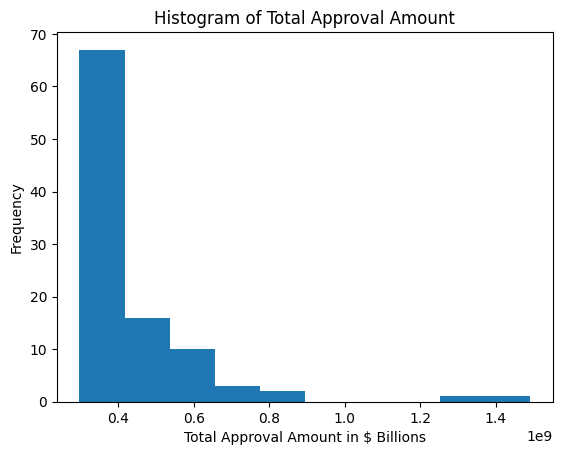

In [109]:
# hist of TotalApprovalAmount

plt.hist(pandas_df["TotalApprovalAmount"])
plt.title("Histogram of Total Approval Amount")
plt.xlabel("Total Approval Amount in $ Billions")
plt.ylabel("Frequency")
plt.show()

# note gap in TotalApprovalAmount between $0.9 - $1.25 billion. why??

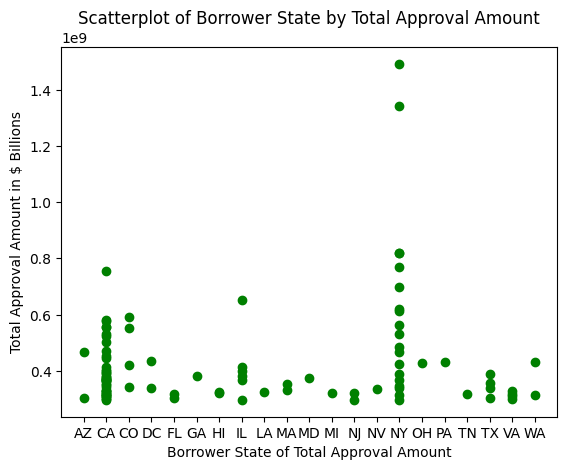

In [110]:
# scatterplot BorrowerState vs TotalApprovalAmount, referencing the pandas df
# which states got the top 100 TotalApprovalAmounts?

plt.scatter(pandas_df_sorted_by_state['BorrowerState'], pandas_df_sorted_by_state['TotalApprovalAmount'], color='green')
plt.title("Scatterplot of Borrower State by Total Approval Amount")
plt.xlabel("Borrower State of Total Approval Amount")
plt.ylabel("Total Approval Amount in $ Billions")
plt.show()

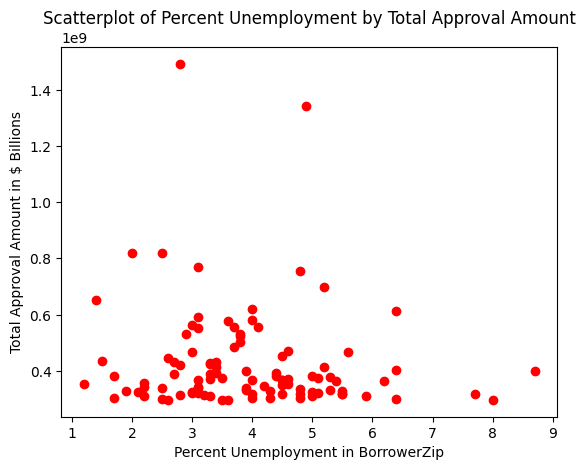

In [112]:
# scatterplot %_Unempl vs TotalApprovalAmount, referencing the pandas df

plt.scatter(pandas_df['%_Unempl'], pandas_df['TotalApprovalAmount'], color='red')
plt.title("Scatterplot of Percent Unemployment by Total Approval Amount")
plt.xlabel("Percent Unemployment in BorrowerZip")
plt.ylabel("Total Approval Amount in $ Billions")
plt.show()


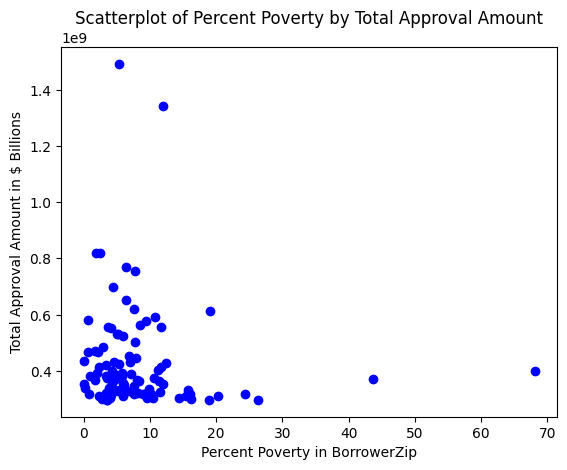

In [113]:
# scatterplot %_Poverty vs TotalApprovalAmount, referencing the pandas df

plt.scatter(pandas_df['%_Poverty'], pandas_df['TotalApprovalAmount'], color='blue')
plt.title("Scatterplot of Percent Poverty by Total Approval Amount")
plt.xlabel("Percent Poverty in BorrowerZip")
plt.ylabel("Total Approval Amount in $ Billions")
plt.show()

## (8) Optional extra credit for +10 points. What are the Top 10 zipcodes that had the highest per capita amount of loans going to Women-Owned businesses?

This column is called `Gender` in the `PPP` data.

* What State are these zipcodes in?
* Comment on if they have anything in common?

💚 Approach:

1. Refresh main df and examine unique counts for Gender; confirm string literal.

    String = "Female Owned"

    There are only 315,838 loans where Gender = "Female Owned", less than half that of Male Owned. The gross majority of the loan rows have Gender = "Unanswered" (1,685,094) so there may be more loans to Female Owned businesses but we can't infer/impute. With over 61% of Gender coded as "Unanswered", drawing any conclusions regarding Female Owned businesses seems questionable.

2. Filter df where Gender == Female Owned, sum CurrentApprovedAmount by BorrowerZip, sort descending to inspect top zip codes (and their states) loaning money to Female Owned borrowers. Interim step before calculating per capita funding by BorrowerZip.

3. Join "sex_and_age-population-female_total_population" (NOTE: FEMALE population, not aggregate total population) from main df to calculate per capita loans, sort descending to see top 10 zip codes lending to Female Owned businesses.

💚 Analysis:
I had to paste this output from an earlier run notebook, because I am getting memory errors trying to .show(10), below.


BorrowerZip      TotalApprovalAmount  BorrowerState  Female_Population ApprovalAmountPerCapita
+-----------+-------------------+-------------+-----------------+-----------------------+
|      64101|             313400|           MO|              1.0|               313400.0|
|      89402|            1222479|           NV|              7.0|               174640.0|
|      37213|             636181|           TN|              4.0|               159045.0|
|      32461|            1313300|           FL|             10.0|               131330.0|
|      28725|             516700|           NC|              4.0|               129175.0|
|      75247|           18785462|           TX|            153.0|               122781.0|
|      33122|            5530314|           FL|             46.0|               120224.0|
|      94104|           18915529|           CA|            169.0|               111926.0|
|      98134|           18287018|           WA|            200.0|                91435.0|
|      98238|             457165|           WA|              5.0|                91433.0|
+-----------+-------------------+-------------+-----------------

      +-------------+-------------------+
      |BorrowerState|TotalApprovalAmount|
      +-------------+-------------------+
      |           CA|         9223137448|
      |           TX|         2540162362|
      |           NY|         2106867851|
      |           FL|         1467327661|
      |           IL|         1200454850|
      |           OH|         1154573901|
      |           CO|         1111831893|
      |           PA|         1075749558|
      |           AZ|          953590487|
      |           NJ|          876726253|
      +-------------+-------------------+

  Aggregate results: If we look at the TotalApprovalAmount loaned to Female Owned businesses by BorrowerZip, you see that NY and CA zipcodes have the highest TotalApprovalAmounts. If we look at TotalApprovalAmount loaned to Female Owned businesses by BorrowerState, we see that CA, TX, NY, FL IL, OH, CO, PA, AZ and NJ are the top 10.
  
  However, when we calculate the per capita funding based on the BorrowerZips' female total population, again the results are skewed by zipcodes with very small female populations, such as zipcode 64101 in Kansas City with a land area: 0.4 sq. mi.

  The top 10 zipcodes' states lending to Women Owned businesses on a per capita basis are: MO, NV, TN, FL, NC, TX, FL, CA, and WA (but really the data need to be normalized).

In [114]:
# examine Gender, confirm literal = "Female Owned"
df.groupBy('Gender').count().show()

+------------+-------+
|      Gender|  count|
+------------+-------+
|  Unanswered|1685094|
|  Male Owned| 750504|
|Female Owned| 315838|
+------------+-------+



In [120]:
# calculate sum of loans (CurrentApprovalAmount) to Female Owned businesses per BorrowerZip
# inspect, sort descending
# don't expect same results per capita
# split up code blocks as ran out of space with join code below
female_owned_df = (
    df.where(F.col("Gender") == "Female Owned")
      .groupBy("BorrowerZip")
      .agg(F.sum("CurrentApprovalAmount").alias("TotalApprovalAmount"))
)


In [121]:
# join female_owned_df with main df "sex_and_age-population-female_total_population"
# examine interim step before calculating per capita loaned amount
# NOTE distinct(); Renamed vs alias

df_renamed = df.withColumnRenamed("sex_and_age-population-female_total_population", "Female_Population")
df_joined = female_owned_df.join(df_renamed.select("BorrowerZip", "BorrowerState", "Female_Population").distinct(), on="BorrowerZip").sort(F.col("TotalApprovalAmount").desc())

# inspect before calculating per capita loaned
df_joined.show(10)

Py4JJavaError: An error occurred while calling o6204.showString.
: java.lang.OutOfMemoryError: GC overhead limit exceeded


In [116]:
# calculate per capita loaned amount to Women Owned businesses

df_joined = df_joined.withColumn(
    "ApprovalAmountPerCapita",
    F.round(df_joined["TotalApprovalAmount"] / df_joined["Female_Population"], 0)
)

df_joined = df_joined.sort(F.col("ApprovalAmountPerCapita").desc()).show(10)

Py4JJavaError: An error occurred while calling o6095.showString.
: java.lang.OutOfMemoryError: Java heap space
	at java.util.Arrays.copyOfRange(Arrays.java:3664)
	at java.lang.String.<init>(String.java:207)
	at java.lang.StringBuilder.toString(StringBuilder.java:412)
	at org.apache.spark.sql.catalyst.util.StringUtils$StringConcat.toString(StringUtils.scala:138)
	at org.apache.spark.sql.catalyst.util.StringUtils$PlanStringConcat.toString(StringUtils.scala:163)
	at org.apache.spark.sql.execution.QueryExecution.toString(QueryExecution.scala:208)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$5(SQLExecution.scala:95)
	at org.apache.spark.sql.execution.SQLExecution$$$Lambda$1373/1894221692.apply(Unknown Source)
	at org.apache.spark.sql.execution.SQLExecution$.withSQLConfPropagated(SQLExecution.scala:160)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$1(SQLExecution.scala:87)
	at org.apache.spark.sql.execution.SQLExecution$$$Lambda$1366/757247200.apply(Unknown Source)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:763)
	at org.apache.spark.sql.execution.SQLExecution$.withNewExecutionId(SQLExecution.scala:64)
	at org.apache.spark.sql.Dataset.withAction(Dataset.scala:3614)
	at org.apache.spark.sql.Dataset.head(Dataset.scala:2695)
	at org.apache.spark.sql.Dataset.take(Dataset.scala:2902)
	at org.apache.spark.sql.Dataset.getRows(Dataset.scala:300)
	at org.apache.spark.sql.Dataset.showString(Dataset.scala:337)
	at sun.reflect.GeneratedMethodAccessor124.invoke(Unknown Source)
	at sun.reflect.DelegatingMethodAccessorImpl.invoke(DelegatingMethodAccessorImpl.java:43)
	at java.lang.reflect.Method.invoke(Method.java:498)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.GatewayConnection.run(GatewayConnection.java:238)
	at java.lang.Thread.run(Thread.java:750)


In [ ]:
# let's look at the BorrowerStates with the largest female populations
# and the largest number of Female Owned businesses
# compare to per capita results above

female_owned_by_state_df = (
    df.where(F.col("Gender") == "Female Owned")
      .groupBy("BorrowerState")
      .agg(F.sum("CurrentApprovalAmount").alias("TotalApprovalAmount"))
)
female_owned_by_state_df = female_owned_by_state_df.sort(F.col("TotalApprovalAmount").desc()).show(10)
female_owned_by_state_df.show(10)


+-------------+-------------------+
|BorrowerState|TotalApprovalAmount|
+-------------+-------------------+
|           CA|         9223137448|
|           TX|         2540162362|
|           NY|         2106867851|
|           FL|         1467327661|
|           IL|         1200454850|
|           OH|         1154573901|
|           CO|         1111831893|
|           PA|         1075749558|
|           AZ|          953590487|
|           NJ|          876726253|
+-------------+-------------------+
only showing top 10 rows



AttributeError: 'NoneType' object has no attribute 'show'

# 🔴 Conclusion (5 pts)

## (1) What did you learn?
Write five detailed bullets about what you learned.

💚 Data sources, environment

I learned to read the source data documentation more thoroughly to facilitate loading data more quickly (and limit frustration...) (tab delimited??). I expected data dictionaries/webites to be more helpful in terms of explaining the meaning behind data better, with formatting. Print schema helps with the latter, but understanding the data better took more digging around if the data dictionary wasn't particularly robust. Examining datasets and keeping a running total of rows/cols is a must (for me). For example, if you only looked for nulls at the head of the BorrowerZip column, you'd miss the miscoding in the BorrowerZip field at the end of the df (where BorrowerCity was coded in the BorrowerState column, and BorrowerState was coded in the BorrowerZip field).

Hopefully this will evolve, but I spend alot of time on "environmental" issues - understanding how to get files where gthey need to be and then read properly. Code snippets (like joins, Qs 7, 8) took many minutes to run and I wonder whether I have a deecent configuration. I also ran out of memory in Q8 trying to do a join and show 10 records.

💚 Using AI

I had not used any AI assistants yet, and upgraded to Colab Pro to use Colab AI, which was helpful particularly in explaining error messages. I also worked with Bard (Gemini) and Copilot, sometimes just to see what other alternative solutions would be generated. I became better at generating more detailed prompts to get my desired results. It is stunning how helpful, from a coding perspective, the AIs can be. I do wish I could have taken this course right after DS with Python, logically. My last large-scale production project was in Adabas Natural, and before that Cobol and Fortran, so this is a hoot.

💚 Pyspark

I'm more comfortable (at this beginning point of the learning journey) to code and review results from a series of steps, and THEN attempt to chain them together and prove that the results are the same. Duplicate code for now, until comfy. I ran into some odd pyspark-specific? problems, for example, not liking some specific characters in the header of the houseing df, and understanding selecting columns and showing them needed to be remembered. I didn't go very far with using pyspark for graphing and referred to my DS with Python notebooks.

💚 Drawing conclusions: generalities

What I'm lacking is how to do a rigorous initial analysis on a very large df to determine which variables to hone in on. I feel like I need to go back to DS with Python and reread how to determine which dimensions/variables to focus on - PCA? when many of the variables are highly correlated with each other and we want to reduce their number. Even the relatively small snippets of code w under 3mio records would run for many minutes in Colab, so trying to look at aggrgate correlations or a heat map wouldn't cut it it(??). I saw that trends we might conclude overall would not hold up when we applied per capita calculations; small populations by BorrowerZip, for example, would skew per capita results. So I think we have to do a bigger/better job looking at the overall df first.

💚 Drawing conclusions: project specific

We saw that the top 10 states that received loans were CA, NY, TX, FL, IL, PA, OH, NJ, MI, CO, not particularly surprising based possibly on overall population (but I didn't prove that correlation). While the largest "known/name" banks were the largest lenders overall, that didn;t hold when we looked at who lent the most to borrowers in their respective states. I was surprised to see lesser know banks lending in-state, but perhaps that's the shape of the business (lending closer to home for these particular loans). The most frequently occurring NAICSCodes. representing law offices and full service food restauarants seems just wrong/curious to me, unless the law-offices-as-borrower are masking loan applications for other businesses that aren't coded at arms' length. It seems more logical that for the time period, full service restaurants' loans were common. It can't just be? that lawyers understood better how to apply for loans than others.
The economic variables that I examined for the BorrowerZips and TotalApprovedAmount did not provide any real insights, which was what really made me think about needing to take a better/more full view of all the df's dimensions. I thought we would see a coorelation between lower income/povery/unemployment with loans and that was not the case. Lastly, with over 61% of Gender coded as "Unanswered", drawing any conclusions regarding Female Owned businesses seems spurious.

      Gender|       count|

    | Unanswered|    1685094|
    | Male Owned|     750504|
    | Female Owned|   315838|


# On Your Own (no credit)
No points - but can you download ALL files for PPP data (several gigabytes of data) and re-run this script with ease? Post on the discussion board if you do!